<a href="https://colab.research.google.com/github/dagapurva3/ECE657A-assign/blob/main/ECE657A_Assign2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore, skew
from sklearn.model_selection import train_test_split, cross_val_score, KFold, GridSearchCV
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.tree import DecisionTreeClassifier, plot_tree, export_text
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from imblearn.combine import SMOTETomek, SMOTEENN
from imblearn.over_sampling import SMOTE
from collections import Counter
from prettytable import PrettyTable


# Set seaborn style
# sns.set(style="ticks", color_codes=True)
sns.set(style="whitegrid")

# Part 1: Assessment of Data and Applying Normalization

1.1 Wine dataset

In [ ]:
# Load Wine Quality Dataset
wine_red = pd.read_csv("winequality-red.csv", sep=';')
wine_white = pd.read_csv("winequality-white.csv", sep=';')

# Add color column (0 = white, 1 = red)
wine_white['color'] = 0
wine_red['color'] = 1
full_wine_dataset = pd.concat([wine_white,wine_red])

In [ ]:
wine_duplicates = full_wine_dataset[full_wine_dataset.duplicated()] #duplicates in dataset
wine_duplicates

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,color
4,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,0
5,8.1,0.280,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6,0
7,7.0,0.270,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6,0
8,6.3,0.300,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6,0
20,6.2,0.660,0.48,1.2,0.029,29.0,75.0,0.98920,3.33,0.39,12.8,8,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1563,7.2,0.695,0.13,2.0,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5,1
1564,7.2,0.695,0.13,2.0,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5,1
1567,7.2,0.695,0.13,2.0,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5,1
1581,6.2,0.560,0.09,1.7,0.053,24.0,32.0,0.99402,3.54,0.60,11.3,5,1


In [ ]:
full_wine_dataset = full_wine_dataset.drop_duplicates()
print("Value count for feature color")
print(full_wine_dataset['color'].value_counts())

Value count for feature color
color
0    3961
1    1359
Name: count, dtype: int64


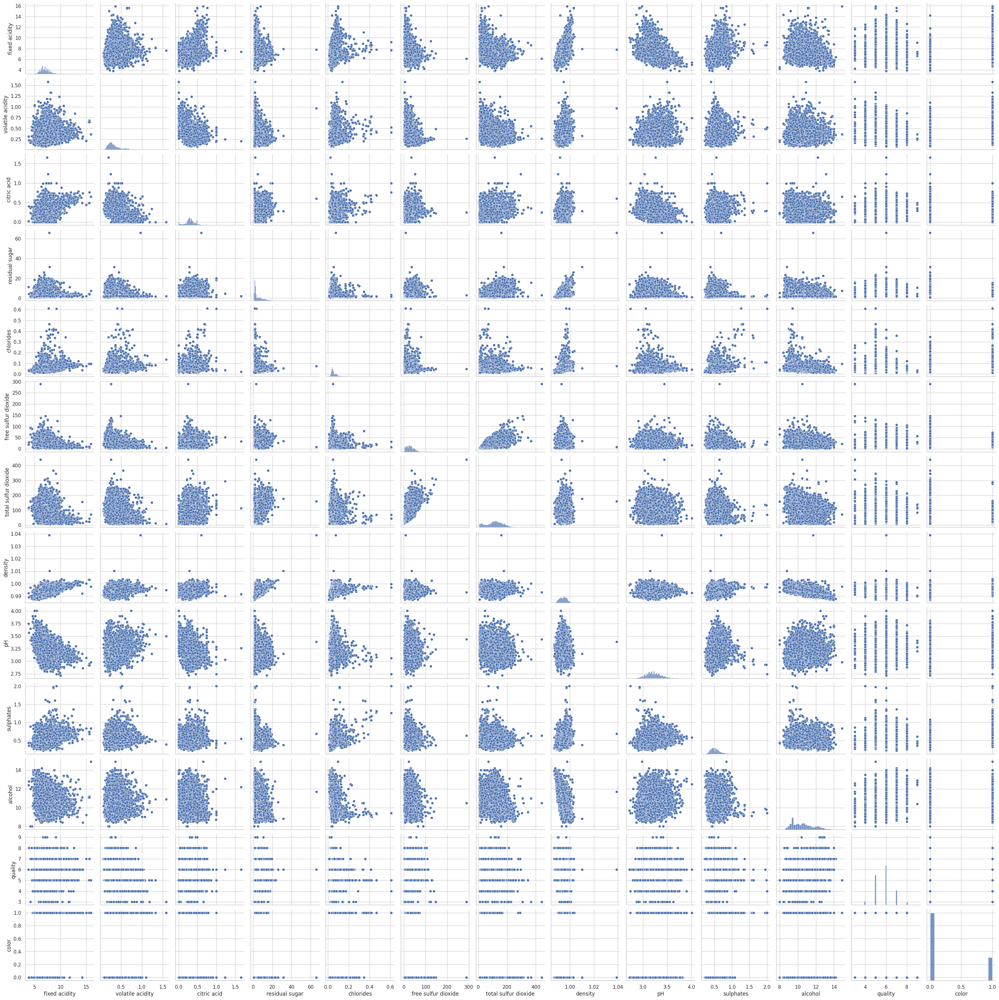

In [ ]:
sns.pairplot(full_wine_dataset)
plt.show()

'Mean:'

,0
fixed acidity,8.319637
volatile acidity,0.527821
citric acid,0.270976
residual sugar,2.538806
chlorides,0.087467
free sulfur dioxide,15.874922
total sulfur dioxide,46.467792
density,0.996747
pH,3.311113
sulphates,0.658149


'Median:'

,0
fixed acidity,7.90000
volatile acidity,0.52000
citric acid,0.26000
residual sugar,2.20000
chlorides,0.07900
free sulfur dioxide,14.00000
total sulfur dioxide,38.00000
density,0.99675
pH,3.31000
sulphates,0.62000


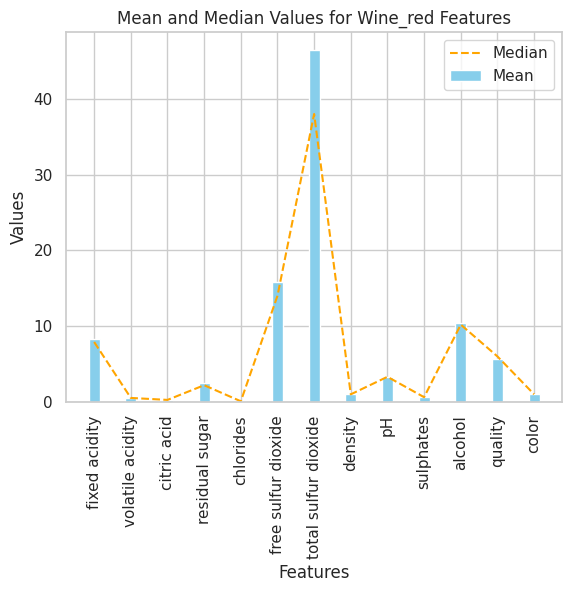

In [ ]:
means = wine_red.mean()
medians = wine_red.median()

display('Mean:', means)
display('Median:', medians)

# Create a bar graph for the mean values
fig, ax = plt.subplots()
bar_width = 0.3
bar_means = ax.bar(means.index, means.values, bar_width, color='skyblue', label='Mean')  # Bar graph color

# Create a line graph for the median values
ax.plot(medians.index, medians.values, '--', color='orange', label='Median')  # Line graph color

# Add labels and title to the plot
ax.set_xlabel('Features')
ax.set_ylabel('Values')
ax.set_title('Mean and Median Values for Wine_red Features')
ax.legend()

# Rotate x-axis labels and show the plot
plt.xticks(rotation=90)
plt.show()

'Mean:'

,0
fixed acidity,6.854788
volatile acidity,0.278241
citric acid,0.334192
residual sugar,6.391415
chlorides,0.045772
free sulfur dioxide,35.308085
total sulfur dioxide,138.360657
density,0.994027
pH,3.188267
sulphates,0.489847


'Median:'

,0
fixed acidity,6.80000
volatile acidity,0.26000
citric acid,0.32000
residual sugar,5.20000
chlorides,0.04300
free sulfur dioxide,34.00000
total sulfur dioxide,134.00000
density,0.99374
pH,3.18000
sulphates,0.47000


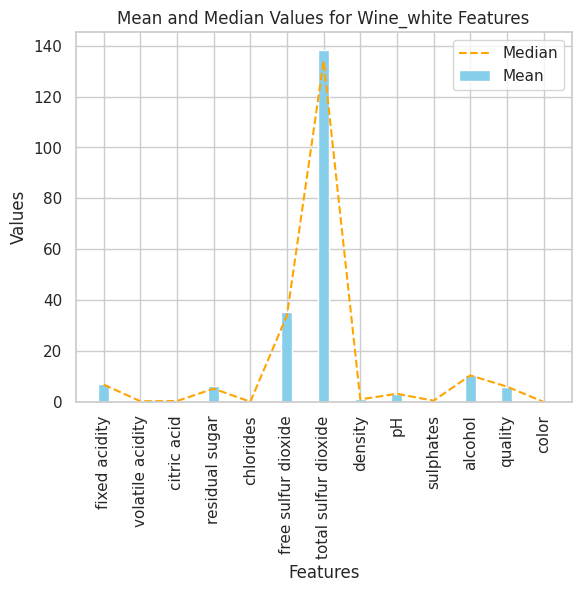

In [ ]:
means = wine_white.mean()
medians = wine_white.median()

display('Mean:', means)
display('Median:', medians)

# Create a bar graph for the mean values
fig, ax = plt.subplots()
bar_width = 0.3
bar_means = ax.bar(means.index, means.values, bar_width, color='skyblue', label='Mean')  # Bar graph color

# Create a line graph for the median values
ax.plot(medians.index, medians.values, '--', color='orange', label='Median')  # Line graph color

# Add labels and title to the plot
ax.set_xlabel('Features')
ax.set_ylabel('Values')
ax.set_title('Mean and Median Values for Wine_white Features')
ax.legend()

# Rotate x-axis labels and show the plot
plt.xticks(rotation=90)
plt.show()

'variance:'

,0
fixed acidity,3.031416
volatile acidity,0.032062
citric acid,0.037947
residual sugar,1.987897
chlorides,0.002215
free sulfur dioxide,109.414884
total sulfur dioxide,1082.102373
density,0.000004
pH,0.023835
sulphates,0.028733


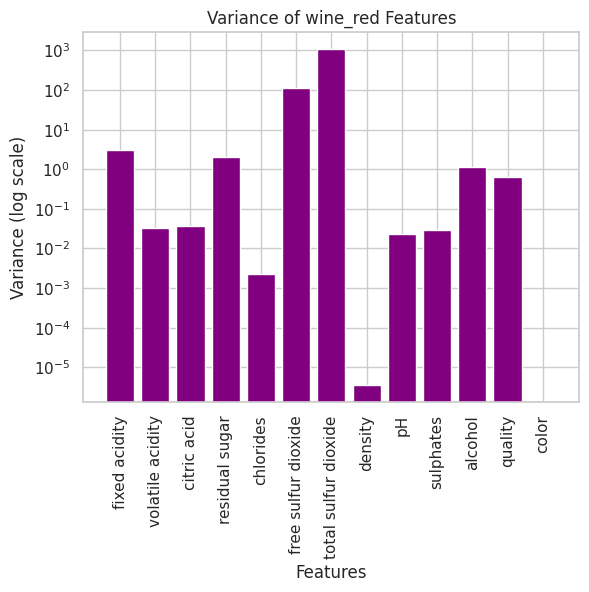

In [ ]:
variances = wine_red.var()
display('variance:', variances)
# Create a bar graph of the variance values
fig, ax = plt.subplots()
ax.bar(variances.index, variances.values, color='purple')
ax.set_yscale('log')
# Add labels and title to the plot
ax.set_xlabel('Features')
ax.set_ylabel('Variance (log scale)')
ax.set_title('Variance of wine_red Features')

# Show the plot
plt.xticks(rotation=90)
plt.show()

'variance:'

,0
fixed acidity,0.712114
volatile acidity,0.010160
citric acid,0.014646
residual sugar,25.725770
chlorides,0.000477
free sulfur dioxide,289.242720
total sulfur dioxide,1806.085491
density,0.000009
pH,0.022801
sulphates,0.013025


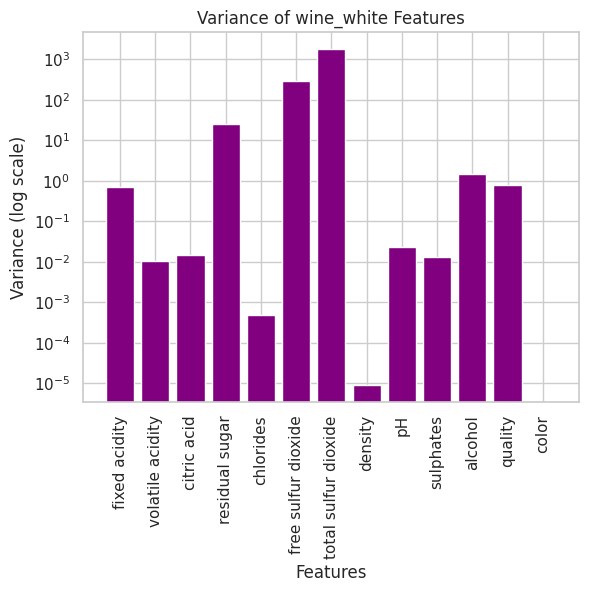

In [ ]:
variances = wine_white.var()
display('variance:', variances)
# Create a bar graph of the variance values
fig, ax = plt.subplots()
ax.bar(variances.index, variances.values, color='purple')
ax.set_yscale('log')
# Add labels and title to the plot
ax.set_xlabel('Features')
ax.set_ylabel('Variance (log scale)')
ax.set_title('Variance of wine_white Features')

# Show the plot
plt.xticks(rotation=90)
plt.show()

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'color'],
      dtype='object')


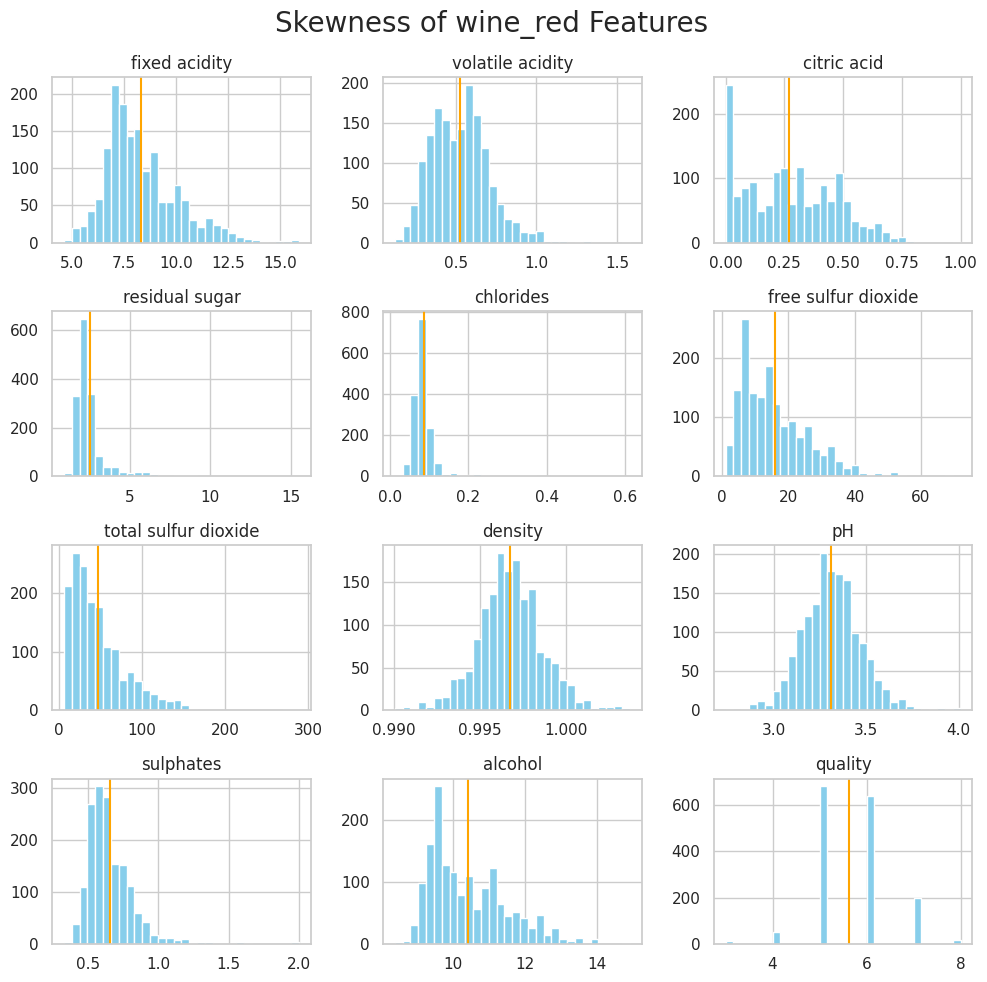

In [ ]:
print(wine_red.columns)

column_names = [
    "fixed acidity", "volatile acidity", "citric acid", "residual sugar",
    "chlorides", "free sulfur dioxide", "total sulfur dioxide", "density",
    "pH", "sulphates", "alcohol", "quality"
]

# Plot skewness for each feature
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(10, 10))

for x, ax in zip(column_names[:], axs.flat):
    if x in wine_red.columns:  # Ensure the column exists
        # Customize histogram color
        wine_red[x].hist(bins=30, ax=ax, color='skyblue')  # Set histogram color

        # Customize mean line color
        ax.axvline(x=np.mean(wine_red[x]), color='orange', label='mean')  # Set mean line color

        ax.set_title(x)

# Add overall title and adjust layout
plt.suptitle('Skewness of wine_red Features', fontsize=20)
plt.tight_layout()
plt.show()

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'color'],
      dtype='object')


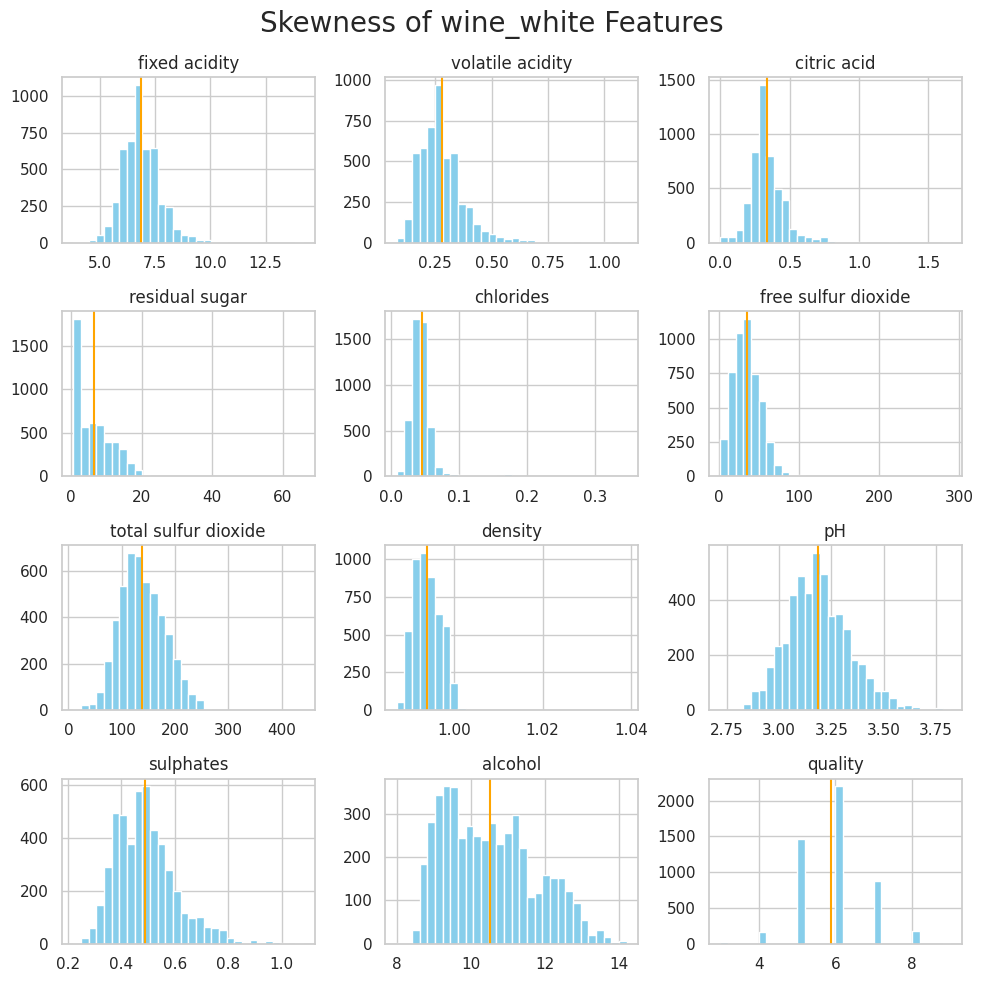

In [ ]:
print(wine_white.columns)

column_names = [
    "fixed acidity", "volatile acidity", "citric acid", "residual sugar",
    "chlorides", "free sulfur dioxide", "total sulfur dioxide", "density",
    "pH", "sulphates", "alcohol", "quality"
]

# Plot skewness for each feature
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(10, 10))

for x, ax in zip(column_names[:], axs.flat):
    if x in wine_red.columns:  # Ensure the column exists
        # Customize histogram color
        wine_white[x].hist(bins=30, ax=ax, color='skyblue')  # Set histogram color

        # Customize mean line color
        ax.axvline(x=np.mean(wine_white[x]), color='orange', label='mean')  # Set mean line color

        ax.set_title(x)

# Add overall title and adjust layout
plt.suptitle('Skewness of wine_white Features', fontsize=20)
plt.tight_layout()
plt.show()

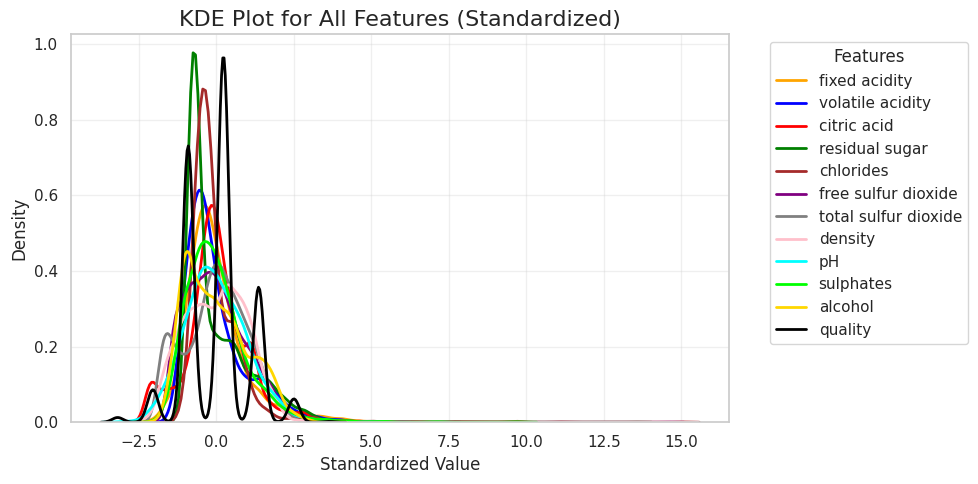

In [ ]:
features = [
    "fixed acidity", "volatile acidity", "citric acid", "residual sugar",
    "chlorides", "free sulfur dioxide", "total sulfur dioxide", "density",
    "pH", "sulphates", "alcohol", "quality"
]

# Standardize the data to have mean=0 and std=1
scaler = StandardScaler()
scaled_data = scaler.fit_transform(full_wine_dataset[features])
scaled_df = pd.DataFrame(scaled_data, columns=features)

# Define a color palette for the plots
colors = [
    'orange', 'blue', 'red', 'green', 'brown', 'purple', 'gray', 'pink',
    'cyan', 'lime', 'gold', 'black'
]

# Plot KDE for each feature on the same graph
plt.figure(figsize=(10, 5))
for feature, color in zip(features, colors):
    sns.kdeplot(scaled_df[feature], label=feature, color=color, linewidth=2)

# Add a legend, title, and axis labels
plt.legend(title="Features", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title("KDE Plot for All Features (Standardized)", fontsize=16)
plt.xlabel("Standardized Value", fontsize=12)
plt.ylabel("Density", fontsize=12)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

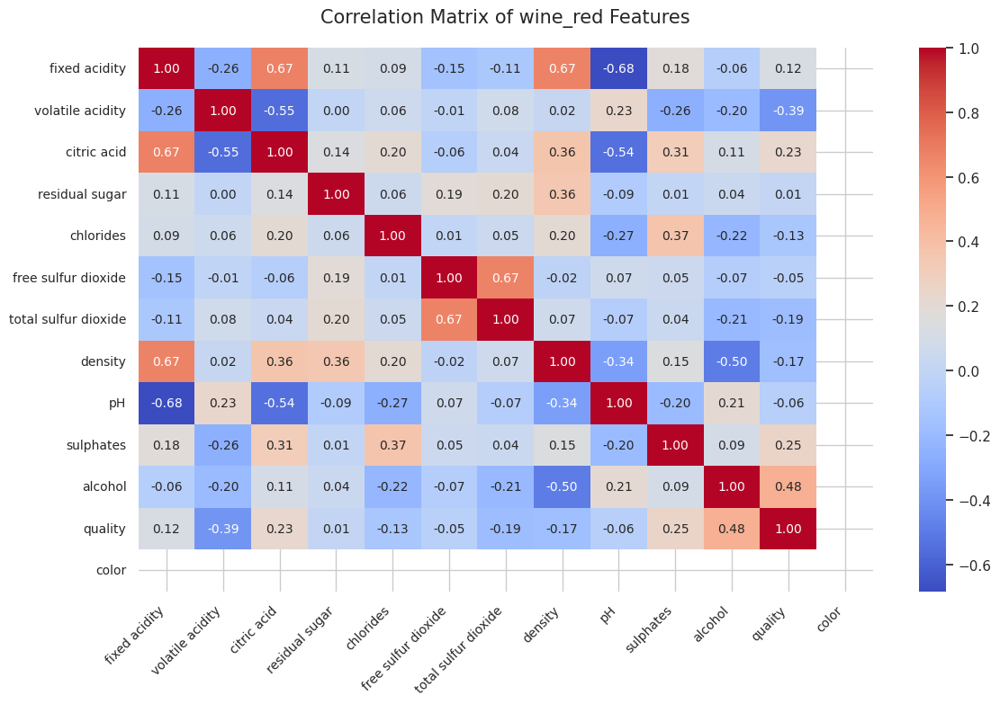

In [ ]:
cormat = wine_red.corr()
round(cormat, 4)

# Plot the heatmap with additional formatting to prevent overlapping
plt.figure(figsize=(12, 8))  # Increase figure size for better readability
sns.heatmap(cormat, cmap='coolwarm', annot=True, fmt=".2f", annot_kws={"size": 10})  # Adjust annotation size

# Rotate x and y axis labels to prevent overlap
plt.xticks(rotation=45, ha='right', fontsize=10)  # Rotate x-axis labels
plt.yticks(rotation=0, fontsize=10)  # Keep y-axis labels horizontal

# Add title and adjust layout
plt.title("Correlation Matrix of wine_red Features", fontsize=15, pad=20)
plt.tight_layout()

plt.show()

In [ ]:
print("Missing values in Wine dataset:", full_wine_dataset.isnull().sum())

Missing values in Wine dataset: fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
color                   0
dtype: int64


In [ ]:
# Compute summary statistics
wine_stats = full_wine_dataset.describe().T
wine_stats['Variance'] = full_wine_dataset.var()
wine_stats['Skew'] = full_wine_dataset.skew()
wine_stats['Kurtosis'] = full_wine_dataset.kurt()
display(wine_stats)

,count,mean,std,min,25%,50%,75%,max,Variance,Skew,Kurtosis
fixed acidity,5320.0,7.215179,1.319671,3.80000,6.4000,7.00000,7.70000,15.90000,1.741531,1.650417,4.589079
volatile acidity,5320.0,0.344130,0.168248,0.08000,0.2300,0.30000,0.41000,1.58000,0.028307,1.504557,2.863175
citric acid,5320.0,0.318494,0.147157,0.00000,0.2400,0.31000,0.40000,1.66000,0.021655,0.484309,2.582471
residual sugar,5320.0,5.048477,4.500180,0.60000,1.8000,2.70000,7.50000,65.80000,20.251621,1.706550,7.025595
chlorides,5320.0,0.056690,0.036863,0.00900,0.0380,0.04700,0.06600,0.61100,0.001359,5.338237,48.260708
free sulfur dioxide,5320.0,30.036654,17.805045,1.00000,16.0000,28.00000,41.00000,289.00000,317.019619,1.362719,9.520706
total sulfur dioxide,5320.0,114.109023,56.774223,6.00000,74.0000,116.00000,153.25000,440.00000,3223.312421,0.063614,-0.299997
density,5320.0,0.994535,0.002966,0.98711,0.9922,0.99465,0.99677,1.03898,0.000009,0.666326,8.711498
pH,5320.0,3.224664,0.160379,2.72000,3.1100,3.21000,3.33000,4.01000,0.025721,0.389969,0.431811
sulphates,5320.0,0.533357,0.149743,0.22000,0.4300,0.51000,0.60000,2.00000,0.022423,1.809454,8.612917


In [ ]:
continuous_features = [feature for feature in full_wine_dataset.select_dtypes(np.number).columns if feature not in ['quality', 'color']]

In [ ]:
from scipy.stats import skew
def skewness_score(dataset, feature_list):
    variables = []
    skew_scores = []
    transformed_skew_scores = []
    for feature in feature_list:
        variables.append(feature)
        skew_scores.append(skew(dataset[feature]))
        if (float(skew(dataset[feature])) >= 0.6) | (float(skew(dataset[feature])) <= -0.6):
          dataset[feature] = np.sqrt(dataset[feature])
        transformed_skew_scores.append(skew(dataset[feature]))
        skew_dict = {'Feature': variables, 'Skewness Score before transformation': skew_scores, 'Skewness score after square root transformation of skewed features': transformed_skew_scores}
        skewness_score = pd.DataFrame(skew_dict)
    return skewness_score

In [ ]:
skewness_score(full_wine_dataset, continuous_features)

,Feature,Skewness Score before transformation,Skewness score after square root transformation of skewed features
0,fixed acidity,1.649952,1.228333
1,volatile acidity,1.504133,0.892989
2,citric acid,0.484172,0.484172
3,residual sugar,1.706069,0.838859
4,chlorides,5.336732,2.449945
5,free sulfur dioxide,1.362335,0.081903
6,total sulfur dioxide,0.063596,0.063596
7,density,0.666138,0.643824
8,pH,0.389859,0.389859
9,sulphates,1.808944,0.972599


In [ ]:
print(full_wine_dataset['color'].value_counts())

color
0    3961
1    1359
Name: count, dtype: int64


<ipython-input-20-7cc11464417b>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x= 'color', data=full_wine_dataset, palette = 'coolwarm')


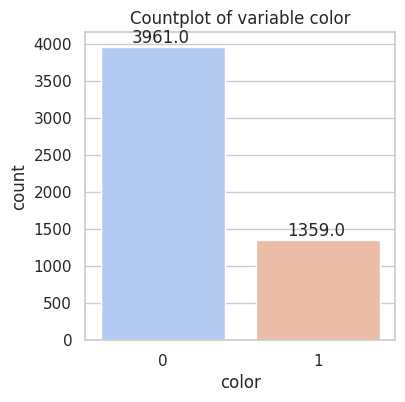

In [ ]:
plt.figure(figsize=(4,4))
plt.ticklabel_format(style='plain')
plt.gca().set_title('Countplot of variable color')
ax = sns.countplot(x= 'color', data=full_wine_dataset, palette = 'coolwarm')
for p in ax.patches:
        ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.2, p.get_height()+50))

In [ ]:
smt = SMOTETomek(random_state=139)

In [ ]:
full_wine_dataset_X = full_wine_dataset.iloc[:,:-1]
full_wine_dataset_Y = full_wine_dataset.iloc[:,-1]

In [ ]:
wine_train_X_processed_full, wine_train_Y_processed_full = smt.fit_resample(full_wine_dataset_X, full_wine_dataset_Y)
print("Number of classes after fit {}".format(Counter(wine_train_Y_processed_full)))
full_wine_dataset_processed = pd.concat([wine_train_X_processed_full, wine_train_Y_processed_full], axis=1)

Number of classes after fit Counter({0: 3944, 1: 3944})


<ipython-input-24-1df03faba456>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x= 'color', data=full_wine_dataset_processed, palette = 'coolwarm')


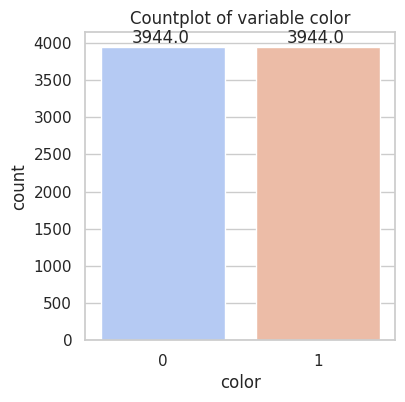

In [ ]:
plt.figure(figsize=(4,4))
plt.ticklabel_format(style='plain')
plt.gca().set_title('Countplot of variable color')
ax = sns.countplot(x= 'color', data=full_wine_dataset_processed, palette = 'coolwarm')
for p in ax.patches:
        ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.2, p.get_height()+50))

In [ ]:
wine_train_X_processed_full.iloc[:, :] = wine_train_X_processed_full.iloc[:, :].apply(zscore)

<ipython-input-25-def435102bcc>:1: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0       0.361511
1       0.361511
2       0.361511
3       0.361511
4       0.361511
          ...   
7883    0.361511
7884    0.361511
7885    1.538886
7886   -0.815864
7887   -0.815864
Name: quality, Length: 7888, dtype: float64' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  wine_train_X_processed_full.iloc[:, :] = wine_train_X_processed_full.iloc[:, :].apply(zscore)


In [ ]:
# Create Train/Test Split
wine_train_X_processed_full = full_wine_dataset_processed.drop(columns=["color"], axis=1)
wine_train_Y_processed_full = full_wine_dataset_processed.color
wine_train_X, wine_test_X, wine_train_Y, wine_test_Y = train_test_split(full_wine_dataset_X, full_wine_dataset_Y, test_size = 0.2, random_state = 42, shuffle=True)
wine_train_X_processed, wine_test_X_processed, wine_train_Y_processed, wine_test_Y_processed = train_test_split(wine_train_X_processed_full, wine_train_Y_processed_full, test_size = 0.2, random_state = 42, shuffle=True)

1.2 Abalone Dataset

In [ ]:
column_names = [
    "Sex", "Length", "Diameter", "Height", "Whole_Weight",
    "Shucked_Weight", "Viscera_Weight", "Shell_Weight", "Rings"
]
abalone_full = pd.read_csv('abalone.csv', names=column_names, header=None)
bins = [0, 4, 8, 12, 16, 20, 24, 28]
labels = ["Baby", "Young", "Middle-Young", "Middle-Aged", "Middle-Old", "Old", "Very Old"]
abalone_full["Age_Category"] = pd.cut(abalone_full["Rings"], bins=bins, labels=labels, include_lowest=True)
abalone_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4177 entries, 0 to 4176
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   Sex             4177 non-null   object  
 1   Length          4177 non-null   float64 
 2   Diameter        4177 non-null   float64 
 3   Height          4177 non-null   float64 
 4   Whole_Weight    4177 non-null   float64 
 5   Shucked_Weight  4177 non-null   float64 
 6   Viscera_Weight  4177 non-null   float64 
 7   Shell_Weight    4177 non-null   float64 
 8   Rings           4177 non-null   int64   
 9   Age_Category    4176 non-null   category
dtypes: category(1), float64(7), int64(1), object(1)
memory usage: 298.3+ KB


In [ ]:
le = LabelEncoder()
abalone_full['Sex'] = le.fit_transform(abalone_full['Sex'])
abalone_full

,Sex,Length,Diameter,Height,Whole_Weight,Shucked_Weight,Viscera_Weight,Shell_Weight,Rings,Age_Category
0,2,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.1500,15,Middle-Aged
1,2,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.0700,7,Young
2,0,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.2100,9,Middle-Young
3,2,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.1550,10,Middle-Young
4,1,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.0550,7,Young
...,...,...,...,...,...,...,...,...,...,...
4172,0,0.565,0.450,0.165,0.8870,0.3700,0.2390,0.2490,11,Middle-Young
4173,2,0.590,0.440,0.135,0.9660,0.4390,0.2145,0.2605,10,Middle-Young
4174,2,0.600,0.475,0.205,1.1760,0.5255,0.2875,0.3080,9,Middle-Young
4175,0,0.625,0.485,0.150,1.0945,0.5310,0.2610,0.2960,10,Middle-Young


In [ ]:
le = LabelEncoder()
abalone_full['Age_Category'] = le.fit_transform(abalone_full['Age_Category'])
abalone_full

,Sex,Length,Diameter,Height,Whole_Weight,Shucked_Weight,Viscera_Weight,Shell_Weight,Rings,Age_Category
0,2,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.1500,15,1
1,2,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.0700,7,6
2,0,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.2100,9,3
3,2,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.1550,10,3
4,1,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.0550,7,6
...,...,...,...,...,...,...,...,...,...,...
4172,0,0.565,0.450,0.165,0.8870,0.3700,0.2390,0.2490,11,3
4173,2,0.590,0.440,0.135,0.9660,0.4390,0.2145,0.2605,10,3
4174,2,0.600,0.475,0.205,1.1760,0.5255,0.2875,0.3080,9,3
4175,0,0.625,0.485,0.150,1.0945,0.5310,0.2610,0.2960,10,3


In [ ]:
 # Answer 2: Computed mean , median , variance , skew , Kurtosis

stats = abalone_full.describe(include='all')

additional_stats = {
    "Variance": abalone_full.var(),
    "Skew": abalone_full.skew(),
    "Kurtosis": abalone_full.kurt()
}

for key, values in additional_stats.items():
    stats.loc[key] = values

print("Descriptive Statistics:\n", stats)

Descriptive Statistics:
                   Sex       Length     Diameter       Height  Whole_Weight  \
count     4177.000000  4177.000000  4177.000000  4177.000000   4177.000000   
mean         1.052909     0.523992     0.407881     0.139516      0.828742   
std          0.822240     0.120093     0.099240     0.041827      0.490389   
min          0.000000     0.075000     0.055000     0.000000      0.002000   
25%          0.000000     0.450000     0.350000     0.115000      0.441500   
50%          1.000000     0.545000     0.425000     0.140000      0.799500   
75%          2.000000     0.615000     0.480000     0.165000      1.153000   
max          2.000000     0.815000     0.650000     1.130000      2.825500   
Variance     0.676079     0.014422     0.009849     0.001750      0.240481   
Skew        -0.098155    -0.639873    -0.609198     3.128817      0.530959   
Kurtosis    -1.514387     0.064621    -0.045476    76.025509     -0.023644   

          Shucked_Weight  Viscera_Weig

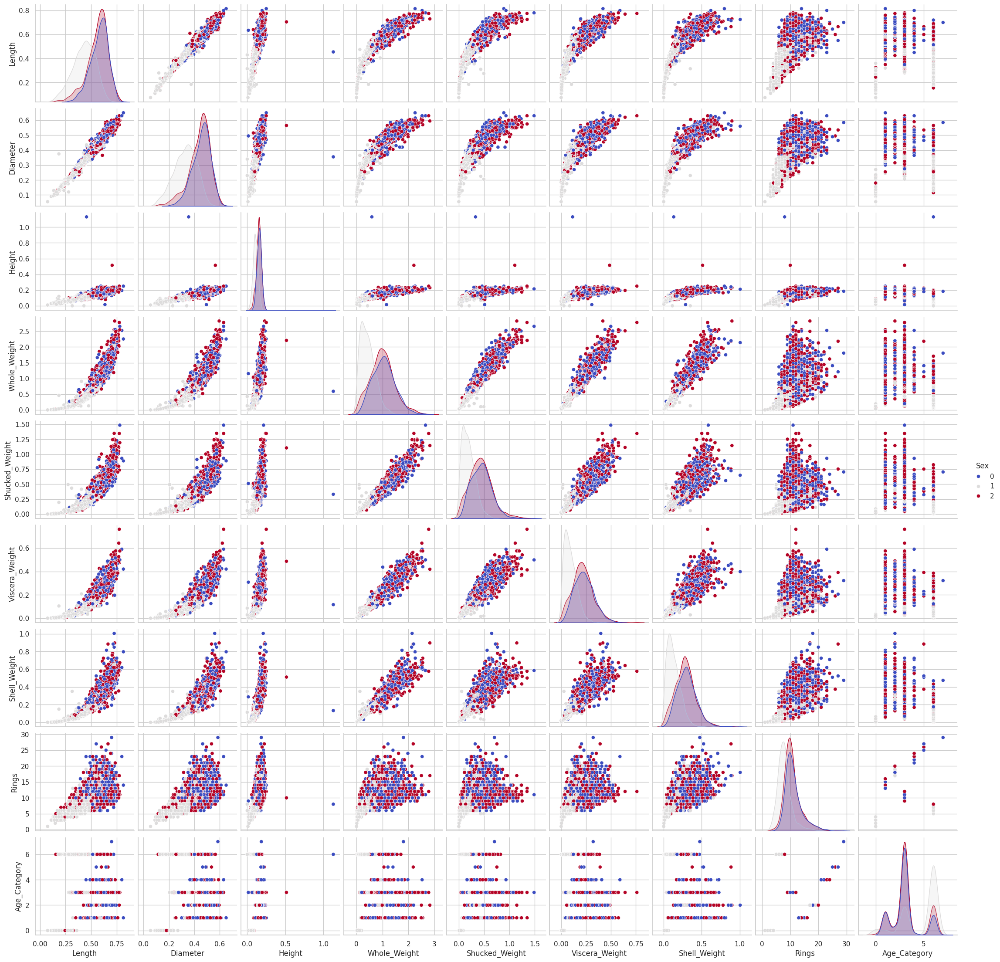

In [ ]:
# Answer 3: Used Pairplot to analyize the data.
sns.pairplot(abalone_full, hue='Sex', palette = 'coolwarm')
plt.show()

'Mean:'

,0
Sex,1.052909
Length,0.523992
Diameter,0.407881
Height,0.139516
Whole_Weight,0.828742
Shucked_Weight,0.359367
Viscera_Weight,0.180594
Shell_Weight,0.238831
Rings,9.933684
Age_Category,3.637778


'Median:'

,0
Sex,1.0000
Length,0.5450
Diameter,0.4250
Height,0.1400
Whole_Weight,0.7995
Shucked_Weight,0.3360
Viscera_Weight,0.1710
Shell_Weight,0.2340
Rings,9.0000
Age_Category,3.0000


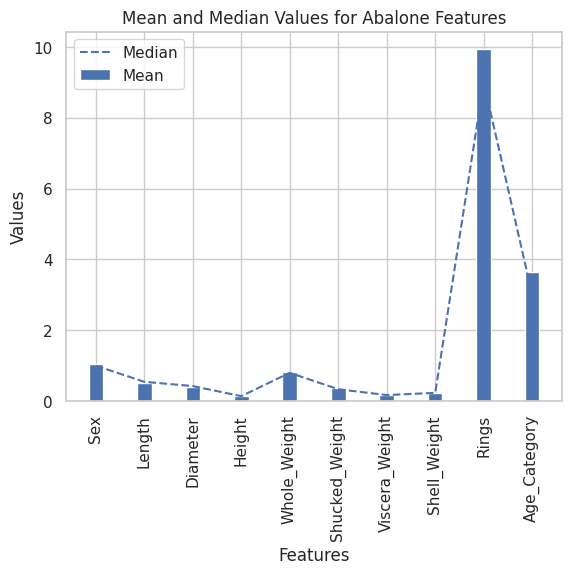

In [ ]:
means = abalone_full.mean()
medians = abalone_full.median()

display('Mean:',means)
display('Median:',medians)


# Create a bar graph for the mean values
fig, ax = plt.subplots()
bar_width = 0.3
bar_means = ax.bar(means.index, means.values, bar_width, label='Mean')

# Create a line graph for the median values
ax.plot(medians.index, medians.values, '--', label='Median')

# Add labels and title to the plot
ax.set_xlabel('Features')
ax.set_ylabel('Values')
ax.set_title('Mean and Median Values for Abalone Features')
ax.legend()

# Show the plot
plt.xticks(rotation=90)
plt.show()

'variance:'

,0
Sex,0.676079
Length,0.014422
Diameter,0.009849
Height,0.001750
Whole_Weight,0.240481
Shucked_Weight,0.049268
Viscera_Weight,0.012015
Shell_Weight,0.019377
Rings,10.395266
Age_Category,3.156360


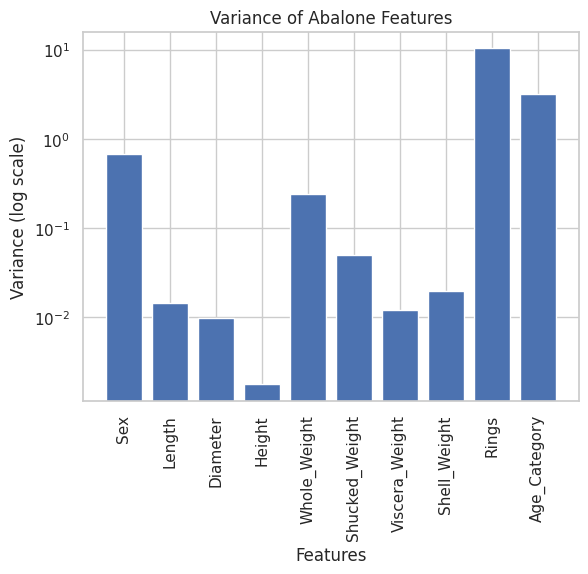

In [ ]:
# Representing Variance of Abalone features

variances = abalone_full.var()
display('variance:', variances)
# Create a bar graph of the variance values
fig, ax = plt.subplots()
ax.bar(variances.index, variances.values)
ax.set_yscale('log')
# Add labels and title to the plot
ax.set_xlabel('Features')
ax.set_ylabel('Variance (log scale)')
ax.set_title('Variance of Abalone Features')

# Show the plot
plt.xticks(rotation=90)
plt.show()

Index(['Sex', 'Length', 'Diameter', 'Height', 'Whole_Weight', 'Shucked_Weight',
       'Viscera_Weight', 'Shell_Weight', 'Rings', 'Age_Category'],
      dtype='object')


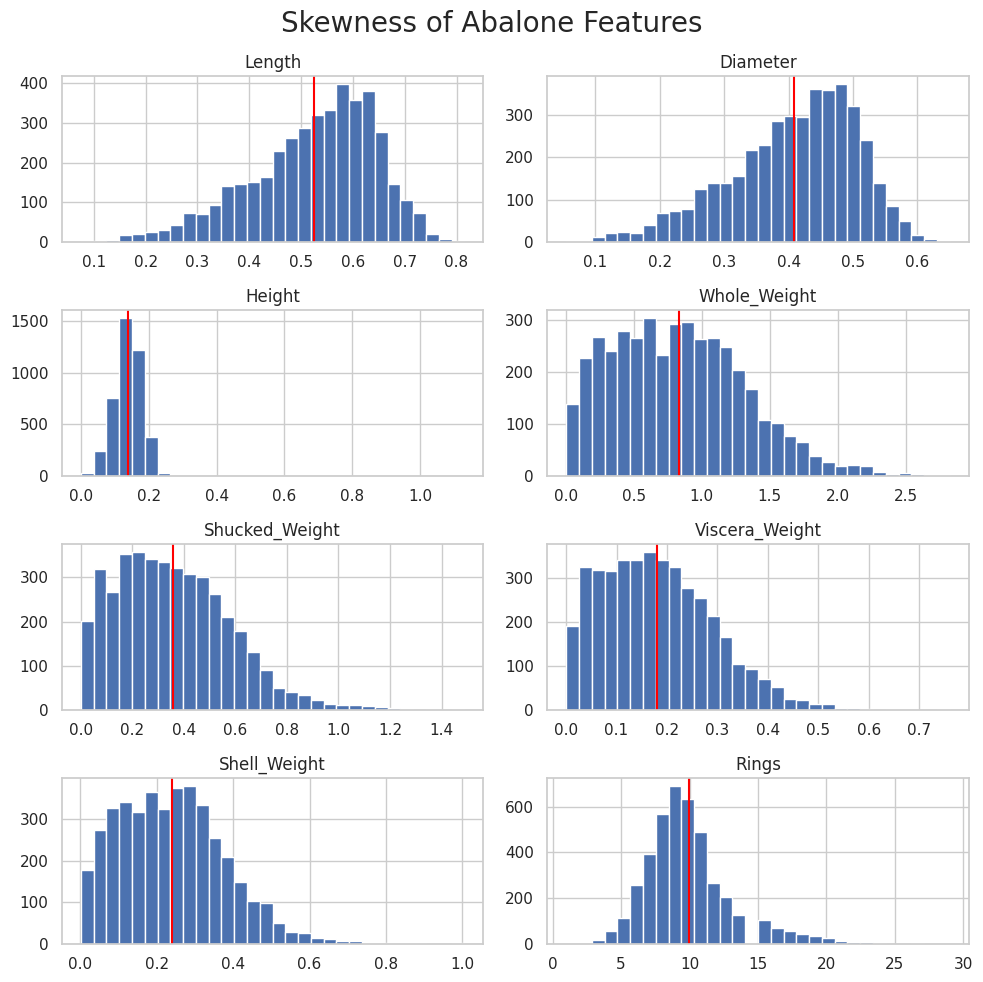

In [ ]:
# Ensuring column names in abalone DataFrame
print(abalone_full.columns)

# Plot skewness for each feature
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(10, 10))

for x, ax in zip(column_names[1:], axs.flat):
    if x in abalone_full.columns:  # Ensure the column exists
        abalone_full[x].hist(bins=30, ax=ax)
        ax.axvline(x=np.mean(abalone_full[x]), color='red', label='mean')
        ax.set_title(x)

plt.suptitle('Skewness of Abalone Features', fontsize=20)
plt.tight_layout()
plt.show()


'Kurtosis:'

,0
Sex,-1.514387
Length,0.064621
Diameter,-0.045476
Height,76.025509
Whole_Weight,-0.023644
Shucked_Weight,0.595124
Viscera_Weight,0.084012
Shell_Weight,0.531926
Rings,2.330687
Age_Category,-1.070584


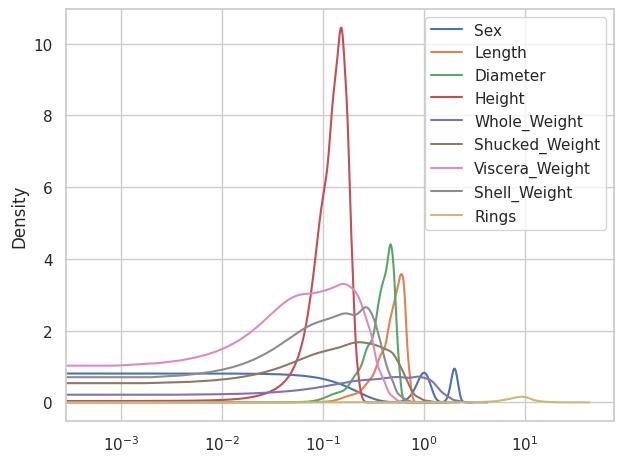

In [ ]:
kurt= abalone_full.kurtosis()
display('Kurtosis:',kurt)
features = [
    "Sex", "Length", "Diameter", "Height", "Whole_Weight",
    "Shucked_Weight", "Viscera_Weight", "Shell_Weight", "Rings"
]

# Show the subplot
fig,ax=plt.subplots()
for feature in features:
    abalone_full[feature].plot.kde(ax=ax,label=feature)

# Add a legend
ax.set_xscale('log')
plt.legend()
plt.tight_layout()

# Show the plot
plt.show()


<Axes: >

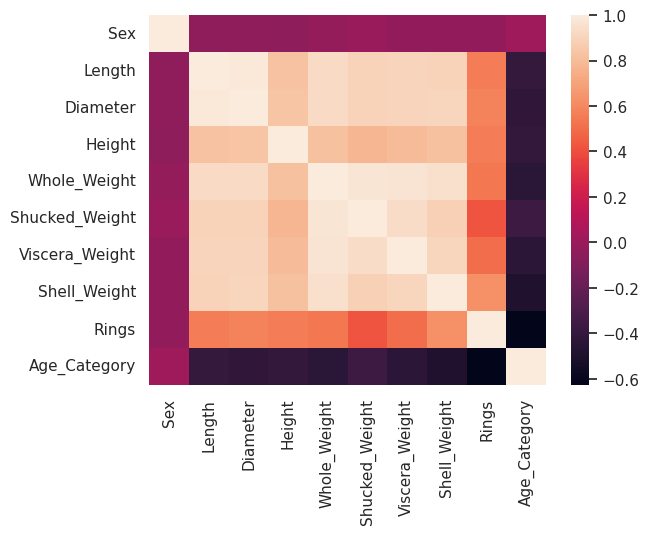

In [ ]:
cormat = abalone_full.corr()
round(cormat,4)
sns.heatmap(cormat)

<ipython-input-37-60faac669f48>:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=abalone_full['Age_Category'],data=abalone_full,palette= 'Set2') #is the data balanced


<Axes: xlabel='Age_Category', ylabel='count'>

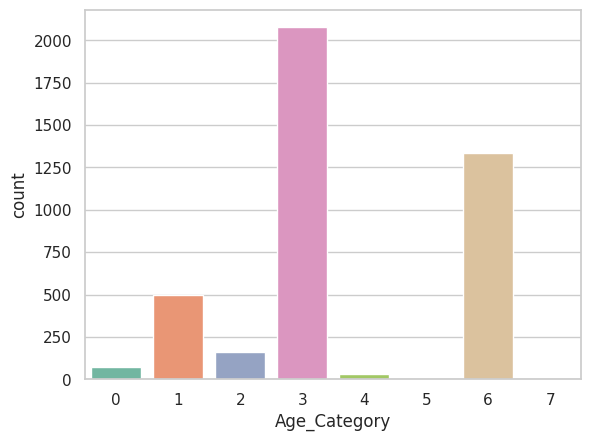

In [ ]:
sns.countplot(x=abalone_full['Age_Category'],data=abalone_full,palette= 'Set2') #is the data balanced

In [ ]:
# Normalising the abalone dataset
numerical_cols = ["Length", "Diameter", "Height", "Whole_Weight", "Shucked_Weight", "Viscera_Weight", "Shell_Weight", "Rings"]
abalone_full[numerical_cols] = abalone_full[numerical_cols].apply(zscore)
abalone_full

,Sex,Length,Diameter,Height,Whole_Weight,Shucked_Weight,Viscera_Weight,Shell_Weight,Rings,Age_Category
0,2,-0.574558,-0.432149,-1.064424,-0.641898,-0.607685,-0.726212,-0.638217,1.571544,1
1,2,-1.448986,-1.439929,-1.183978,-1.230277,-1.170910,-1.205221,-1.212987,-0.910013,6
2,0,0.050033,0.122130,-0.107991,-0.309469,-0.463500,-0.356690,-0.207139,-0.289624,3
3,2,-0.699476,-0.432149,-0.347099,-0.637819,-0.648238,-0.607600,-0.602294,0.020571,3
4,1,-1.615544,-1.540707,-1.423087,-1.272086,-1.215968,-1.287337,-1.320757,-0.910013,6
...,...,...,...,...,...,...,...,...,...,...
4172,0,0.341509,0.424464,0.609334,0.118813,0.047908,0.532900,0.073062,0.330765,3
4173,2,0.549706,0.323686,-0.107991,0.279929,0.358808,0.309362,0.155685,0.020571,3
4174,2,0.632985,0.676409,1.565767,0.708212,0.748559,0.975413,0.496955,-0.289624,3
4175,0,0.841182,0.777187,0.250672,0.541998,0.773341,0.733627,0.410739,0.020571,3


In [ ]:
abalone_X = abalone_full.drop(columns=["Rings", "Age_Category"])
abalone_Y = abalone_full["Age_Category"]

In [ ]:
abalone_X_train, abalone_X_test, abalone_Y_train, abalone_Y_test= train_test_split(abalone_X, abalone_Y, random_state=123, train_size=0.8)

In [ ]:
z_scaled= abalone_full.copy()
for column in z_scaled.columns[1:]:
     z_scaled[column]= (z_scaled[column]-z_scaled[column].mean())/z_scaled[column].std()

abalone_full_processed = z_scaled

In [ ]:
# Normalize
z_scaled= abalone_X.copy()
for column in z_scaled.columns[1:]:
     z_scaled[column]= (z_scaled[column]-z_scaled[column].mean())/z_scaled[column].std()
z_scaled

,Sex,Length,Diameter,Height,Whole_Weight,Shucked_Weight,Viscera_Weight,Shell_Weight
0,2,-0.574489,-0.432097,-1.064297,-0.641821,-0.607613,-0.726125,-0.638140
1,2,-1.448812,-1.439757,-1.183837,-1.230130,-1.170770,-1.205077,-1.212842
2,0,0.050027,0.122116,-0.107978,-0.309432,-0.463444,-0.356647,-0.207114
3,2,-0.699393,-0.432097,-0.347058,-0.637743,-0.648160,-0.607527,-0.602222
4,1,-1.615350,-1.540523,-1.422916,-1.271933,-1.215822,-1.287183,-1.320599
...,...,...,...,...,...,...,...,...
4172,0,0.341468,0.424414,0.609261,0.118799,0.047902,0.532836,0.073053
4173,2,0.549640,0.323648,-0.107978,0.279896,0.358765,0.309325,0.155666
4174,2,0.632909,0.676328,1.565580,0.708127,0.748470,0.975296,0.496895
4175,0,0.841081,0.777094,0.250642,0.541933,0.773248,0.733540,0.410690


In [ ]:
abalone_X_train_processed, abalone_X_test_processed, abalone_Y_train_processed, abalone_Y_test_processed = train_test_split(z_scaled, abalone_Y, test_size=0.2, random_state=42, shuffle=True)

In [ ]:
!pip install category_encoders

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 2.6 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
import category_encoders as ce

In [ ]:
forest_fires = pd.read_csv('forestfires.csv')


In [ ]:
forest_fires.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   X       517 non-null    int64  
 1   Y       517 non-null    int64  
 2   month   517 non-null    object 
 3   day     517 non-null    object 
 4   FFMC    517 non-null    float64
 5   DMC     517 non-null    float64
 6   DC      517 non-null    float64
 7   ISI     517 non-null    float64
 8   temp    517 non-null    float64
 9   RH      517 non-null    int64  
 10  wind    517 non-null    float64
 11  rain    517 non-null    float64
 12  area    517 non-null    float64
dtypes: float64(8), int64(3), object(2)
memory usage: 52.6+ KB


In [ ]:
wine = full_wine_dataset_processed
abalone = abalone_full_processed


In [ ]:
def preprocess_data(df, target):
    df = df.dropna()  # Remove missing values
    numerical_features = df.select_dtypes(include=['number']).columns.tolist()
    categorical_features = df.select_dtypes(include=['object']).columns.tolist()

    # Remove the target variable from the features list
    numerical_features.remove(target) if target in numerical_features else None
    categorical_features.remove(target) if target in categorical_features else None

    # Apply ordinal encoding to categorical features
    if categorical_features:  # Check if there are any categorical features
        encoder = ce.OrdinalEncoder(cols=categorical_features, handle_unknown='value', handle_missing='value')
        df = encoder.fit_transform(df)

    X = df.drop(columns=[target])
    y = df[target]

    # Only scale numerical features
    X[numerical_features] = StandardScaler().fit_transform(X[numerical_features])

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    return X_train, X_test, y_train, y_test

# Train and evaluate models
def train_and_evaluate(model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    rmse = mean_squared_error(y_test, y_pred)
    return rmse

In [ ]:
models = {
    'KNN': KNeighborsRegressor(n_neighbors=5),
    'Decision Tree': DecisionTreeRegressor(max_depth=5),
    'Random Forest': RandomForestRegressor(n_estimators=100),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=100)
}

datasets = {'Wine': (wine, 'quality'), 'Abalone': (abalone, 'Rings'), 'Forest Fires': (forest_fires, 'area')}



In [ ]:
results = {}
for name, (df, target) in datasets.items():
    X_train, X_test, y_train, y_test = preprocess_data(df, target)
    rmse_scores = {}
    for model_name, model in models.items():
        rmse = train_and_evaluate(model, X_train, X_test, y_train, y_test)
        rmse_scores[model_name] = rmse
    results[name] = rmse_scores

{'Wine': {'KNN': 0.4210899873257288, 'Decision Tree': 0.5061904281717484, 'Random Forest': 0.37594277566539924, 'Gradient Boosting': 0.42428003486266463}, 'Abalone': {'KNN': 0.2566819863461696, 'Decision Tree': 0.07885594511896599, 'Random Forest': 0.07926347977305924, 'Gradient Boosting': 0.07420491955059533}, 'Forest Fires': {'KNN': 11632.798220153842, 'Decision Tree': 10603.03930960296, 'Random Forest': 11526.802035432192, 'Gradient Boosting': 11582.63911818258}}


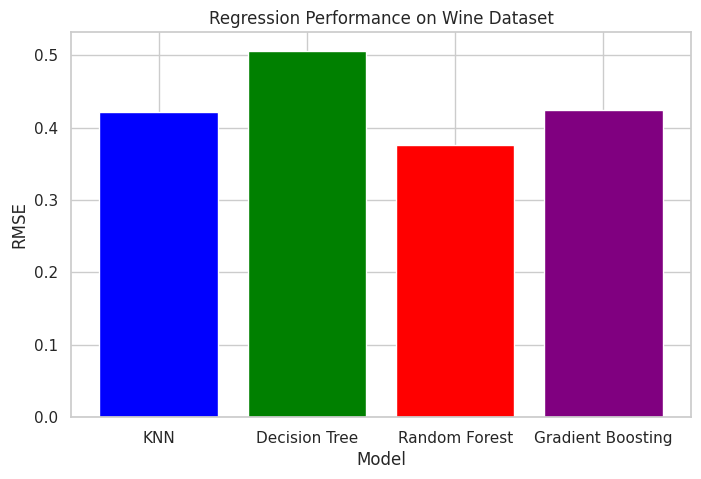

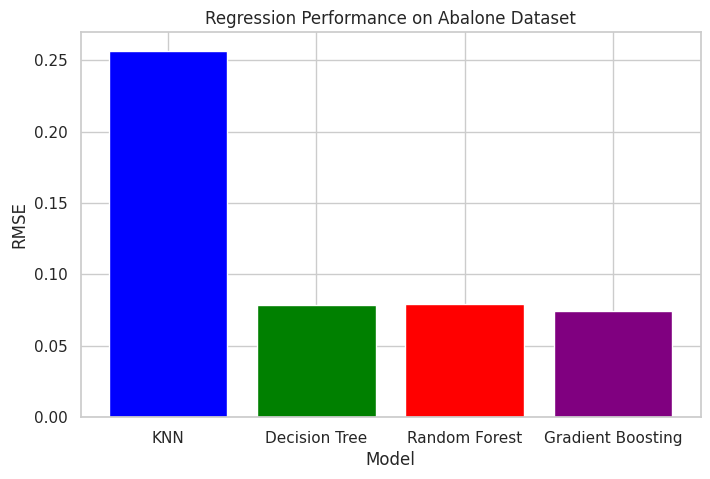

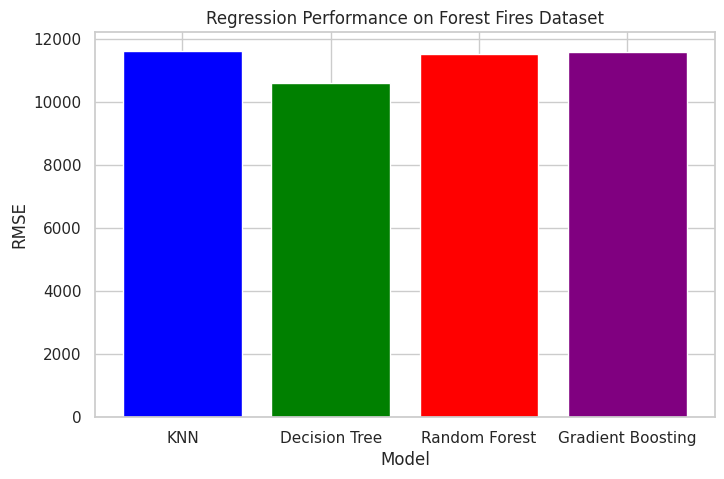

In [ ]:
print(results)
for dataset, scores in results.items():
    plt.figure(figsize=(8, 5))
    plt.bar(scores.keys(), scores.values(), color=['blue', 'green', 'red', 'purple'])
    plt.xlabel('Model')
    plt.ylabel('RMSE')
    plt.title(f'Regression Performance on {dataset} Dataset')
    plt.show()

In [ ]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE


In [ ]:

# Apply PCA
def apply_pca(X):
  pca = PCA(n_components=2)
  return pca.fit_transform(X)

# Apply t-SNE
def apply_tsne(X):
  tsne = TSNE(n_components=2, perplexity=30, random_state=42)
  return tsne.fit_transform(X)

# Visualize results
def plot_transformed(X_transformed,y_train, title):
    plt.scatter(X_transformed[:, 0], X_transformed[:, 1], y_train, cmap='coolwarm', alpha=0.7)
    plt.title(title)
    plt.colorbar()
    plt.show()



<ipython-input-73-d2fd0d5ec4be>:13: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_transformed[:, 0], X_transformed[:, 1], y_train, cmap='coolwarm', alpha=0.7)


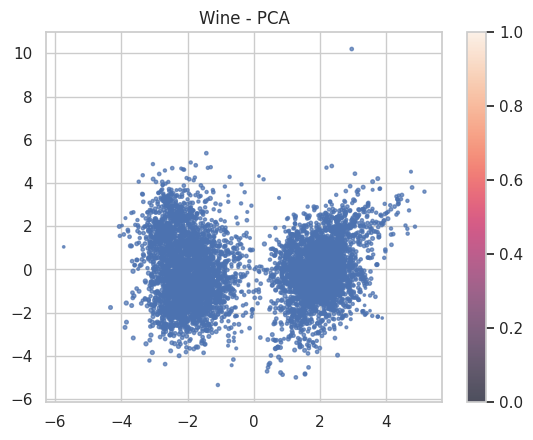

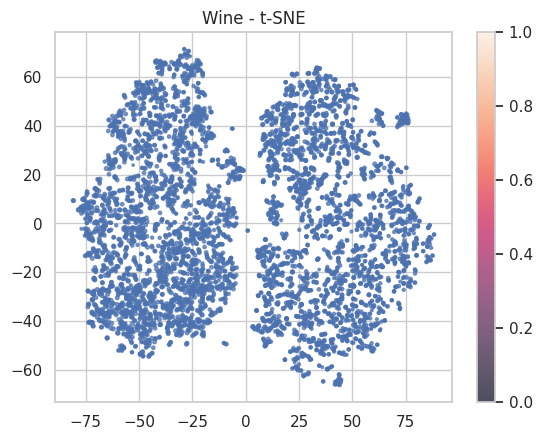

/usr/local/lib/python3.11/dist-packages/matplotlib/collections.py:1008: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
<ipython-input-73-d2fd0d5ec4be>:13: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_transformed[:, 0], X_transformed[:, 1], y_train, cmap='coolwarm', alpha=0.7)


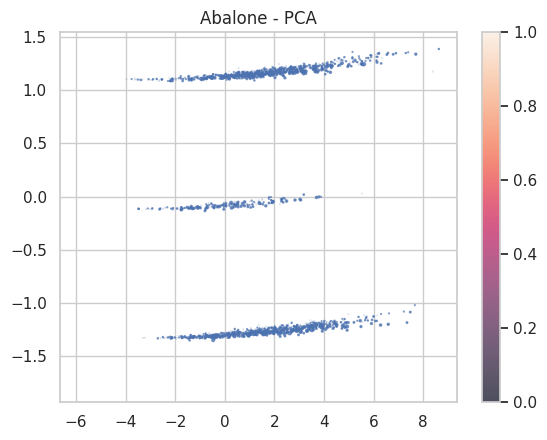

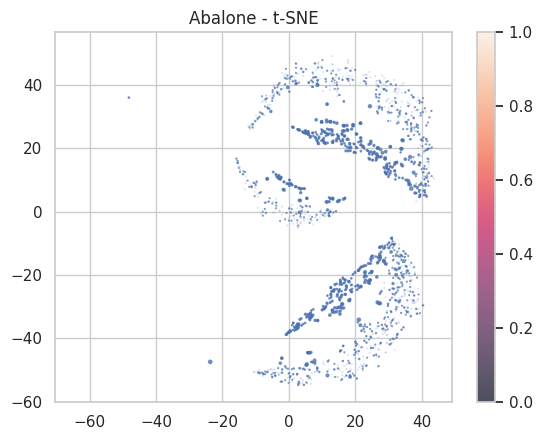

<ipython-input-73-d2fd0d5ec4be>:13: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_transformed[:, 0], X_transformed[:, 1], y_train, cmap='coolwarm', alpha=0.7)


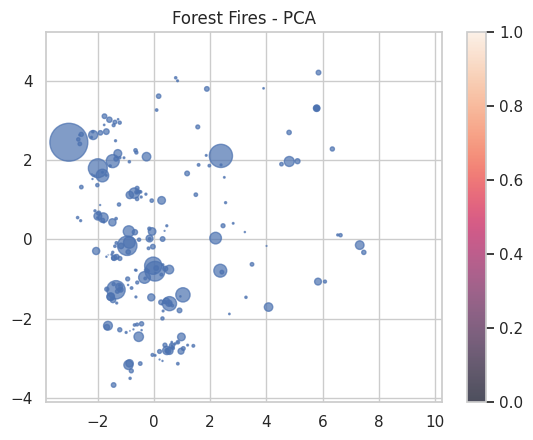

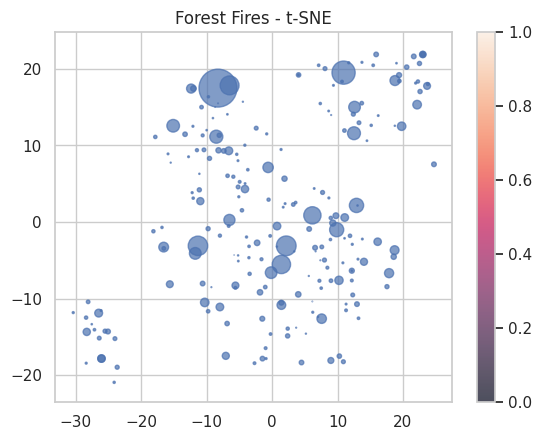

In [ ]:
for name, (df, target) in datasets.items():
  X_train, X_test, y_train, y_test = preprocess_data(df, target)

  X_pca = apply_pca(X_train)
  X_tsne = apply_tsne(X_train)

  plot_transformed(X_pca,y_train, f"{name} - PCA")
  plot_transformed(X_tsne,y_train, f"{name} - t-SNE")

Loading Wine Quality Dataset...
Wine Quality Dataset loaded. Shape: (6497, 13)
Feature columns: ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol', 'quality', 'color']
Target variable: 'quality'
Loading Abalone Dataset...
Abalone Dataset loaded. Shape: (4177, 9)
Feature columns: ['Sex', 'Length', 'Diameter', 'Height', 'Whole_weight', 'Shucked_weight', 'Viscera_weight', 'Shell_weight', 'Rings']
Target variable: 'Rings'
Loading Forest Fires Dataset...
Forest Fires Dataset loaded. Shape: (517, 13)
Feature columns: ['X', 'Y', 'month', 'day', 'FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH', 'wind', 'rain', 'area']
Target variable: 'area'

--- Preprocessing Wine Quality Dataset ---
No missing values found.
Handling outliers using IQR method...
Found 357 outliers in column 'fixed acidity'
Found 377 outliers in column 'volatile acidity'
Found 509 outliers in column 'citric acid'
Fou

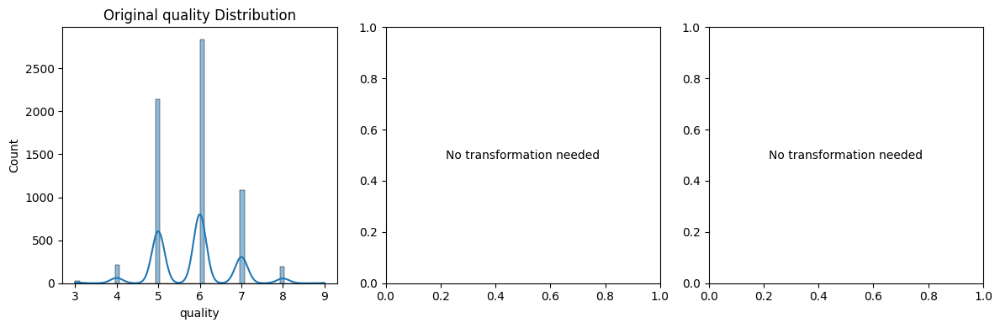

Normalizing Wine Quality data...

--- Preprocessing Abalone Dataset ---
No missing values found.
Encoding categorical variables...
Encoding column: Sex
Handling outliers using IQR method...
Found 49 outliers in column 'Length'
Found 59 outliers in column 'Diameter'
Found 29 outliers in column 'Height'
Found 30 outliers in column 'Whole_weight'
Found 48 outliers in column 'Shucked_weight'
Found 26 outliers in column 'Viscera_weight'
Found 35 outliers in column 'Shell_weight'
Analyzing target variable: Rings
Target skewness: 1.1137
Target is right-skewed. Applying log transformation.
Box-Cox transformation applied with lambda=0.1676


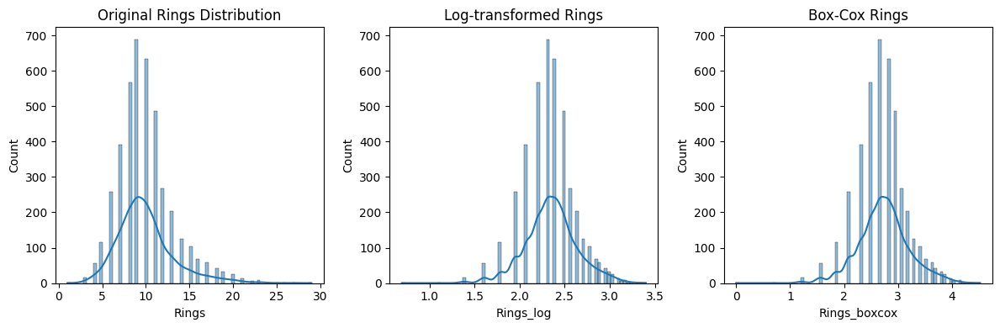

Normalizing Abalone data...
Applying SMOTETomek for balanced dataset...
SMOTETomek failed: 'Series' object has no attribute 'categories'. Using standard scaled data instead.

--- Preprocessing Forest Fires Dataset ---
No missing values found.
Handling outliers using IQR method...
Found 51 outliers in column 'Y'
Found 53 outliers in column 'FFMC'
Found 17 outliers in column 'DMC'
Found 8 outliers in column 'DC'
Found 23 outliers in column 'ISI'
Found 2 outliers in column 'temp'
Found 12 outliers in column 'RH'
Found 13 outliers in column 'wind'
Found 8 outliers in column 'rain'
Found 76 outliers in column 'month_num'
The target 'area' in Forest Fires dataset often has many zeros and a long tail.
Applying log(x+1) transformation as suggested by the dataset authors.


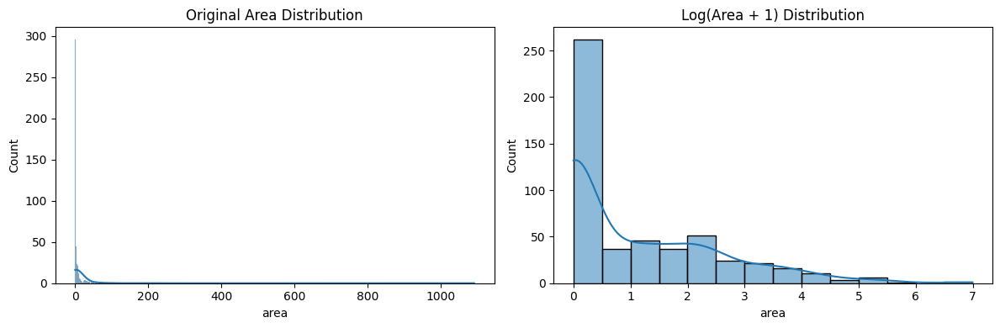

Normalizing Forest Fires data...
Applying SMOTETomek for balanced dataset...
SMOTETomek failed: 'Series' object has no attribute 'categories'. Using standard scaled data instead.
Setting up 5-fold cross-validation...

--- All datasets loaded and preprocessed successfully! ---

Wine Quality Dataset:
  - X shape: (6497, 12)
  - y shape: (6497,)
  - Transform type: none

Abalone Dataset:
  - X shape: (4177, 9)
  - y shape: (4177,)
  - Transform type: boxcox

Forest Fires Dataset:
  - X shape: (517, 12)
  - y shape: (517,)
  - Transform type: log


In [1]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import KFold
from imblearn.combine import SMOTETomek
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

# Set random seed for reproducibility
np.random.seed(42)

# Function to load and preprocess the Wine Quality dataset
def load_wine_quality_data():
    print("Loading Wine Quality Dataset...")

    # Load red wine data
    red_wine = pd.read_csv('winequality-red.csv', sep=';')
    red_wine['color'] = 1  # Add color feature (1 for red)

    # Load white wine data
    white_wine = pd.read_csv('winequality-white.csv', sep=';')
    white_wine['color'] = 0  # Add color feature (0 for white)

    # Combine datasets
    wine_data = pd.concat([red_wine, white_wine], ignore_index=True)

    print(f"Wine Quality Dataset loaded. Shape: {wine_data.shape}")
    print(f"Feature columns: {wine_data.columns.tolist()}")
    print(f"Target variable: 'quality'")

    return wine_data

# Function to load and preprocess the Abalone dataset
def load_abalone_data():
    print("Loading Abalone Dataset...")

    # Define column names
    column_names = ['Sex', 'Length', 'Diameter', 'Height', 'Whole_weight',
                    'Shucked_weight', 'Viscera_weight', 'Shell_weight', 'Rings']

    # Load data
    abalone_data = pd.read_csv('abalone.csv', names=column_names)

    print(f"Abalone Dataset loaded. Shape: {abalone_data.shape}")
    print(f"Feature columns: {abalone_data.columns.tolist()}")
    print(f"Target variable: 'Rings'")

    return abalone_data

# Function to load and preprocess the Forest Fires dataset
def load_forest_fires_data():
    print("Loading Forest Fires Dataset...")

    # Load data from UCI repository
    forest_fires_data = pd.read_csv('forestfires.csv')

    print(f"Forest Fires Dataset loaded. Shape: {forest_fires_data.shape}")
    print(f"Feature columns: {forest_fires_data.columns.tolist()}")
    print(f"Target variable: 'area'")

    return forest_fires_data

# Function to handle missing values
def handle_missing_values(df):
    # Check for missing values
    missing_values = df.isnull().sum()
    if missing_values.sum() > 0:
        print(f"Missing values found:\n{missing_values[missing_values > 0]}")

        # For numerical columns, fill with median
        num_cols = df.select_dtypes(include=np.number).columns
        for col in num_cols:
            if df[col].isnull().sum() > 0:
                df[col] = df[col].fillna(df[col].median())

        # For categorical columns, fill with mode
        cat_cols = df.select_dtypes(exclude=np.number).columns
        for col in cat_cols:
            if df[col].isnull().sum() > 0:
                df[col] = df[col].fillna(df[col].mode()[0])
    else:
        print("No missing values found.")

    return df

# Function to handle outliers using IQR method
def handle_outliers(df, columns, target_col):
    print("Handling outliers using IQR method...")
    df_processed = df.copy()

    for col in columns:
        if col != target_col and df_processed[col].dtype in ['int64', 'float64']:
            Q1 = df_processed[col].quantile(0.25)
            Q3 = df_processed[col].quantile(0.75)
            IQR = Q3 - Q1

            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR

            # Identify outliers
            outliers = ((df_processed[col] < lower_bound) | (df_processed[col] > upper_bound))

            if outliers.sum() > 0:
                print(f"Found {outliers.sum()} outliers in column '{col}'")

                # Cap outliers at boundaries instead of removing them
                df_processed.loc[df_processed[col] < lower_bound, col] = lower_bound
                df_processed.loc[df_processed[col] > upper_bound, col] = upper_bound

    return df_processed

# Function to encode categorical variables
def encode_categorical(df):
    print("Encoding categorical variables...")
    df_encoded = df.copy()

    for col in df_encoded.columns:
        if df_encoded[col].dtype == 'object':
            print(f"Encoding column: {col}")
            # Use pandas get_dummies for one-hot encoding
            dummies = pd.get_dummies(df_encoded[col], prefix=col, drop_first=True)
            df_encoded = pd.concat([df_encoded.drop(col, axis=1), dummies], axis=1)

    return df_encoded

# Function to normalize data with option for SMOTETomek
def normalize_data(X, y, use_smote=False, dataset_name=""):
    print(f"Normalizing {dataset_name} data...")

    # Scale features using StandardScaler
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Apply SMOTETomek for regression if requested
    if use_smote:
        print("Applying SMOTETomek for balanced dataset...")
        # Note: SMOTETomek is typically used for classification, not regression
        # For regression, we'll need a modified approach

        # For regression, we can discretize the target variable temporarily
        y_discrete = pd.qcut(y, q=5, labels=False, duplicates='drop')

        try:
            smote_tomek = SMOTETomek(random_state=42)
            X_resampled, y_discrete_resampled = smote_tomek.fit_resample(X_scaled, y_discrete)

            # Map back to the original continuous values
            # This is a simple approach - map each discrete bin back to its mean value
            bins = pd.qcut(y, q=5, duplicates='drop')
            bin_means = {}
            for i in range(len(bins.categories)):
                bin_indices = (y_discrete == i)
                if any(bin_indices):
                    bin_means[i] = y[bin_indices].mean()

            # Get original y values based on the discrete bins
            y_resampled = np.array([bin_means.get(val, y.mean()) for val in y_discrete_resampled])

            print(f"Data shape after SMOTETomek: {X_resampled.shape}")
            return X_resampled, y_resampled, scaler
        except Exception as e:
            print(f"SMOTETomek failed: {e}. Using standard scaled data instead.")
            return X_scaled, y, scaler

    return X_scaled, y, scaler

# Function to analyze and transform the target variable
def analyze_target(df, target_col):
    print(f"Analyzing target variable: {target_col}")

    plt.figure(figsize=(12, 4))

    # Original distribution
    plt.subplot(1, 3, 1)
    sns.histplot(df[target_col], kde=True)
    plt.title(f"Original {target_col} Distribution")

    # Log transformation if data is right-skewed
    skewness = stats.skew(df[target_col])
    print(f"Target skewness: {skewness:.4f}")

    if skewness > 1:
        print(f"Target is right-skewed. Applying log transformation.")

        # Handle zero values for log transform
        min_non_zero = df[df[target_col] > 0][target_col].min()
        df_transformed = df.copy()

        # Log transform (add small constant to handle zeros)
        df_transformed[f"{target_col}_log"] = np.log1p(df_transformed[target_col])

        plt.subplot(1, 3, 2)
        sns.histplot(df_transformed[f"{target_col}_log"], kde=True)
        plt.title(f"Log-transformed {target_col}")

        # Box-Cox transformation
        try:
            # Add a small constant to make all values positive
            offset = 0 if df[target_col].min() > 0 else abs(df[target_col].min()) + 1e-6
            transformed_data, lambda_param = stats.boxcox(df[target_col] + offset)

            df_transformed[f"{target_col}_boxcox"] = transformed_data
            print(f"Box-Cox transformation applied with lambda={lambda_param:.4f}")

            plt.subplot(1, 3, 3)
            sns.histplot(df_transformed[f"{target_col}_boxcox"], kde=True)
            plt.title(f"Box-Cox {target_col}")

            transform_type = "boxcox"
            transformed_target = transformed_data
        except:
            print("Box-Cox transformation failed. Using log transformation.")
            transform_type = "log"
            transformed_target = df_transformed[f"{target_col}_log"].values
    else:
        print("Target is not heavily skewed. No transformation needed.")
        transform_type = "none"
        transformed_target = df[target_col].values

        plt.subplot(1, 3, 2)
        plt.text(0.5, 0.5, "No transformation needed", ha='center', va='center')
        plt.subplot(1, 3, 3)
        plt.text(0.5, 0.5, "No transformation needed", ha='center', va='center')

    plt.tight_layout()
    plt.show()

    return transformed_target, transform_type

# Function to preprocess wine quality data
def preprocess_wine_quality(df):
    print("\n--- Preprocessing Wine Quality Dataset ---")

    # Create a copy of the dataframe
    df_processed = df.copy()

    # Check for missing values and handle them
    df_processed = handle_missing_values(df_processed)

    # Feature selection (all columns except 'quality' as features)
    features = df_processed.drop('quality', axis=1)
    target = df_processed['quality']

    # Handle outliers in features
    df_processed = handle_outliers(df_processed, features.columns, 'quality')

    # Update features and target after outlier handling
    features = df_processed.drop('quality', axis=1)
    target = df_processed['quality']

    # Analyze and potentially transform the target
    transformed_target, transform_type = analyze_target(df_processed, 'quality')

    # Normalize the features
    X_scaled, y_scaled, scaler = normalize_data(features, target, use_smote=False, dataset_name="Wine Quality")

    return X_scaled, y_scaled, features.columns, scaler, transform_type

# Function to preprocess abalone data
def preprocess_abalone(df):
    print("\n--- Preprocessing Abalone Dataset ---")

    # Create a copy of the dataframe
    df_processed = df.copy()

    # Check for missing values and handle them
    df_processed = handle_missing_values(df_processed)

    # Encode categorical variables (Sex)
    df_processed = encode_categorical(df_processed)

    # Feature selection (all columns except 'Rings' as features)
    features = df_processed.drop('Rings', axis=1)
    target = df_processed['Rings']

    # Handle outliers in features
    df_processed = handle_outliers(df_processed, features.columns, 'Rings')

    # Update features and target after outlier handling
    features = df_processed.drop('Rings', axis=1)
    target = df_processed['Rings']

    # Analyze and potentially transform the target
    transformed_target, transform_type = analyze_target(df_processed, 'Rings')

    # Normalize the features
    X_scaled, y_scaled, scaler = normalize_data(features, target, use_smote=True, dataset_name="Abalone")

    return X_scaled, y_scaled, features.columns, scaler, transform_type

# Function to preprocess forest fires data
def preprocess_forest_fires(df):
    print("\n--- Preprocessing Forest Fires Dataset ---")

    # Create a copy of the dataframe
    df_processed = df.copy()

    # Check for missing values and handle them
    df_processed = handle_missing_values(df_processed)

    # Encode categorical variables (month and day)
    # For month, convert to numeric based on order
    month_order = {'jan': 1, 'feb': 2, 'mar': 3, 'apr': 4, 'may': 5, 'jun': 6,
                   'jul': 7, 'aug': 8, 'sep': 9, 'oct': 10, 'nov': 11, 'dec': 12}

    df_processed['month_num'] = df_processed['month'].map(month_order)

    # For day, convert to numeric based on order
    day_order = {'mon': 1, 'tue': 2, 'wed': 3, 'thu': 4, 'fri': 5, 'sat': 6, 'sun': 7}
    df_processed['day_num'] = df_processed['day'].map(day_order)

    # Drop original month and day columns
    df_processed = df_processed.drop(['month', 'day'], axis=1)

    # Feature selection (all columns except 'area' as features)
    features = df_processed.drop('area', axis=1)
    target = df_processed['area']

    # Handle outliers in features
    df_processed = handle_outliers(df_processed, features.columns, 'area')

    # Update features and target after outlier handling
    features = df_processed.drop('area', axis=1)
    target = df_processed['area']

    # The forest fires data has many zeros and a long tail, log transformation is recommended
    print("The target 'area' in Forest Fires dataset often has many zeros and a long tail.")
    print("Applying log(x+1) transformation as suggested by the dataset authors.")

    # Apply log(area + 1) transformation as recommended in the dataset description
    transformed_target = np.log1p(target)
    transform_type = "log"

    # Show the transformation
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    sns.histplot(target, kde=True)
    plt.title("Original Area Distribution")

    plt.subplot(1, 2, 2)
    sns.histplot(transformed_target, kde=True)
    plt.title("Log(Area + 1) Distribution")

    plt.tight_layout()
    plt.show()

    # Normalize the features
    X_scaled, y_scaled, scaler = normalize_data(features, transformed_target, use_smote=True, dataset_name="Forest_Fires")

    return X_scaled, y_scaled, features.columns, scaler, transform_type

# Function to set up cross-validation
def setup_cross_validation(n_splits=5):
    print(f"Setting up {n_splits}-fold cross-validation...")
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)
    return kf

# Main function to load and preprocess all datasets
def load_and_preprocess_all_datasets():
    # Load datasets
    wine_data = load_wine_quality_data()
    abalone_data = load_abalone_data()
    forest_fires_data = load_forest_fires_data()

    # Preprocess datasets
    X_wine, y_wine, wine_features, wine_scaler, wine_transform = preprocess_wine_quality(wine_data)
    X_abalone, y_abalone, abalone_features, abalone_scaler, abalone_transform = preprocess_abalone(abalone_data)
    X_forest, y_forest, forest_features, forest_scaler, forest_transform = preprocess_forest_fires(forest_fires_data)

    # Set up cross-validation
    kf = setup_cross_validation(n_splits=5)

    # Create a dictionary to hold all processed datasets
    datasets = {
        'wine': {
            'X': X_wine,
            'y': y_wine,
            'feature_names': wine_features,
            'scaler': wine_scaler,
            'transform_type': wine_transform,
            'name': 'Wine_Quality'
        },
        'abalone': {
            'X': X_abalone,
            'y': y_abalone,
            'feature_names': abalone_features,
            'scaler': abalone_scaler,
            'transform_type': abalone_transform,
            'name': 'Abalone'
        },
        'forest_fires': {
            'X': X_forest,
            'y': y_forest,
            'feature_names': forest_features,
            'scaler': forest_scaler,
            'transform_type': forest_transform,
            'name': 'Forest_Fires'
        },
        'cv': kf
    }

    print("\n--- All datasets loaded and preprocessed successfully! ---")

    # Print dataset summaries
    for key, dataset in datasets.items():
        if key != 'cv':
            print(f"\n{dataset['name']} Dataset:")
            print(f"  - X shape: {dataset['X'].shape}")
            print(f"  - y shape: {dataset['y'].shape}")
            print(f"  - Transform type: {dataset['transform_type']}")

    return datasets


datasets = load_and_preprocess_all_datasets()

In [4]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import GridSearchCV, cross_val_score
import xgboost as XGBRegressor  # Additional algorithm variant
import time
import warnings
warnings.filterwarnings('ignore')

# Set random seed for reproducibility
np.random.seed(42)

# Function to calculate Root Mean Squared Error (RMSE)
def calculate_rmse(y_true, y_pred):
    """
    Calculate Root Mean Squared Error

    Parameters:
    y_true (array): Actual target values
    y_pred (array): Predicted target values

    Returns:
    float: RMSE value
    """
    return np.sqrt(mean_squared_error(y_true, y_pred))

# Function to calculate Mean Absolute Error (MAE)
def calculate_mae(y_true, y_pred):
    """
    Calculate Mean Absolute Error

    Parameters:
    y_true (array): Actual target values
    y_pred (array): Predicted target values

    Returns:
    float: MAE value
    """
    return mean_absolute_error(y_true, y_pred)

# Function to calculate R-squared
def calculate_r2(y_true, y_pred):
    """
    Calculate R-squared (coefficient of determination)

    Parameters:
    y_true (array): Actual target values
    y_pred (array): Predicted target values

    Returns:
    float: R-squared value
    """
    return r2_score(y_true, y_pred)

# Function to evaluate a model using cross-validation
def evaluate_model_cv(model, X, y, cv, model_name, dataset_name, transform_type):
    """
    Evaluate a regression model using cross-validation

    Parameters:
    model (object): Initialized model
    X (array): Feature matrix
    y (array): Target values
    cv (object): Cross-validator
    model_name (str): Name of the model
    dataset_name (str): Name of the dataset
    transform_type (str): Type of transformation applied to target

    Returns:
    dict: Dictionary with evaluation metrics
    """
    print(f"\nEvaluating {model_name} on {dataset_name} dataset...")

    # Metrics to track
    rmse_scores = []
    mae_scores = []
    r2_scores = []
    training_times = []
    prediction_times = []

    # For tracking fold number
    fold = 1

    # Cross-validation
    for train_idx, test_idx in cv.split(X):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        # Time the training process
        start_time = time.time()
        model.fit(X_train, y_train)
        train_time = time.time() - start_time
        training_times.append(train_time)

        # Time the prediction process
        start_time = time.time()
        y_pred = model.predict(X_test)
        pred_time = time.time() - start_time
        prediction_times.append(pred_time)

        # If target was transformed, we need to inverse transform for proper evaluation
        # This part would require storing the transformation parameters from Step 3
        # For simplicity, we'll just evaluate on the transformed scale

        # Calculate metrics
        rmse = calculate_rmse(y_test, y_pred)
        mae = calculate_mae(y_test, y_pred)
        r2 = calculate_r2(y_test, y_pred)

        # Store metrics
        rmse_scores.append(rmse)
        mae_scores.append(mae)
        r2_scores.append(r2)

        print(f"  Fold {fold} - RMSE: {rmse:.4f}, MAE: {mae:.4f}, R²: {r2:.4f}")
        fold += 1

    # Calculate average metrics
    avg_rmse = np.mean(rmse_scores)
    avg_mae = np.mean(mae_scores)
    avg_r2 = np.mean(r2_scores)
    avg_train_time = np.mean(training_times)
    avg_pred_time = np.mean(prediction_times)

    # Calculate standard deviation for metrics
    std_rmse = np.std(rmse_scores)
    std_mae = np.std(mae_scores)
    std_r2 = np.std(r2_scores)

    print(f"\n{model_name} on {dataset_name} - Average Metrics:")
    print(f"  RMSE: {avg_rmse:.4f} ± {std_rmse:.4f}")
    print(f"  MAE: {avg_mae:.4f} ± {std_mae:.4f}")
    print(f"  R²: {avg_r2:.4f} ± {std_r2:.4f}")
    print(f"  Avg. Training Time: {avg_train_time:.4f} seconds")
    print(f"  Avg. Prediction Time: {avg_pred_time:.4f} seconds")

    # If target was transformed, add note about interpretation
    if transform_type != "none":
        print(f"  Note: Metrics are on {transform_type}-transformed scale")

    # Return metrics as dictionary
    return {
        'model_name': model_name,
        'dataset_name': dataset_name,
        'avg_rmse': avg_rmse,
        'std_rmse': std_rmse,
        'avg_mae': avg_mae,
        'std_mae': std_mae,
        'avg_r2': avg_r2,
        'std_r2': std_r2,
        'avg_train_time': avg_train_time,
        'avg_pred_time': avg_pred_time,
        'transform_type': transform_type
    }

# Function to initialize and configure k-NN Regressor
def configure_knn(n_neighbors=5, weights='uniform', p=2):
    """
    Configure k-Nearest Neighbors Regressor

    Parameters:
    n_neighbors (int): Number of neighbors
    weights (str): Weight function used in prediction
    p (int): Power parameter for Minkowski metric

    Returns:
    object: Configured KNeighborsRegressor
    """
    return KNeighborsRegressor(
        n_neighbors=n_neighbors,
        weights=weights,
        p=p,
        n_jobs=-1
    )

# Function to initialize and configure Decision Tree Regressor
def configure_decision_tree(max_depth=None, min_samples_split=2, min_samples_leaf=1):
    """
    Configure Decision Tree Regressor

    Parameters:
    max_depth (int): Maximum depth of the tree
    min_samples_split (int): Minimum samples required to split a node
    min_samples_leaf (int): Minimum samples required at a leaf node

    Returns:
    object: Configured DecisionTreeRegressor
    """
    return DecisionTreeRegressor(
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        random_state=42
    )

# Function to initialize and configure Random Forest Regressor
def configure_random_forest(n_estimators=100, max_depth=None, min_samples_split=2):
    """
    Configure Random Forest Regressor

    Parameters:
    n_estimators (int): Number of trees
    max_depth (int): Maximum depth of trees
    min_samples_split (int): Minimum samples required to split a node

    Returns:
    object: Configured RandomForestRegressor
    """
    return RandomForestRegressor(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        random_state=42,
        n_jobs=-1
    )

# Function to initialize and configure Gradient Boosting Regressor
def configure_gradient_boosting(n_estimators=100, learning_rate=0.1, max_depth=3, subsample=1.0):
    """
    Configure Gradient Boosting Regressor

    Parameters:
    n_estimators (int): Number of boosting stages
    learning_rate (float): Learning rate
    max_depth (int): Maximum depth of individual estimators
    subsample (float): Fraction of samples to be used for fitting individual base learners

    Returns:
    object: Configured GradientBoostingRegressor
    """
    return GradientBoostingRegressor(
        n_estimators=n_estimators,
        learning_rate=learning_rate,
        max_depth=max_depth,
        subsample=subsample,
        random_state=42
    )

# Function to initialize and configure XGBoost Regressor (additional model)
def configure_xgboost(n_estimators=100, learning_rate=0.1, max_depth=3, subsample=1.0):
    """
    Configure XGBoost Regressor

    Parameters:
    n_estimators (int): Number of boosting rounds
    learning_rate (float): Learning rate
    max_depth (int): Maximum tree depth
    subsample (float): Subsample ratio of the training instances

    Returns:
    object: Configured XGBRegressor
    """
    return XGBRegressor.XGBRegressor(
        n_estimators=n_estimators,
        learning_rate=learning_rate,
        max_depth=max_depth,
        subsample=subsample,
        random_state=42,
        n_jobs=-1
    )

# Function to find optimal hyperparameters for k-NN using GridSearchCV
def tune_knn_hyperparameters(X, y, cv):
    """
    Tune hyperparameters for k-NN Regressor

    Parameters:
    X (array): Feature matrix
    y (array): Target values
    cv (object): Cross-validator

    Returns:
    dict: Best hyperparameters
    """
    print("\nTuning k-NN hyperparameters...")

    # Define parameter grid
    param_grid = {
        'n_neighbors': [3, 5, 7, 9, 11],
        'weights': ['uniform', 'distance'],
        'p': [1, 2]  # 1: Manhattan distance, 2: Euclidean distance
    }

    # Initialize model
    knn = KNeighborsRegressor()

    # Initialize GridSearchCV
    grid_search = GridSearchCV(
        estimator=knn,
        param_grid=param_grid,
        cv=cv,
        scoring='neg_root_mean_squared_error',
        n_jobs=-1
    )

    # Fit GridSearchCV
    grid_search.fit(X, y)

    # Get best parameters
    best_params = grid_search.best_params_
    best_score = -grid_search.best_score_  # Convert negative RMSE back to positive

    print(f"Best k-NN Parameters: {best_params}")
    print(f"Best k-NN RMSE: {best_score:.4f}")

    return best_params

# Function to find optimal hyperparameters for Decision Tree using GridSearchCV
def tune_dt_hyperparameters(X, y, cv):
    """
    Tune hyperparameters for Decision Tree Regressor

    Parameters:
    X (array): Feature matrix
    y (array): Target values
    cv (object): Cross-validator

    Returns:
    dict: Best hyperparameters
    """
    print("\nTuning Decision Tree hyperparameters...")

    # Define parameter grid
    param_grid = {
        'max_depth': [None, 5, 10, 15, 20],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }

    # Initialize model
    dt = DecisionTreeRegressor(random_state=42)

    # Initialize GridSearchCV
    grid_search = GridSearchCV(
        estimator=dt,
        param_grid=param_grid,
        cv=cv,
        scoring='neg_root_mean_squared_error',
        n_jobs=-1
    )

    # Fit GridSearchCV
    grid_search.fit(X, y)

    # Get best parameters
    best_params = grid_search.best_params_
    best_score = -grid_search.best_score_  # Convert negative RMSE back to positive

    print(f"Best Decision Tree Parameters: {best_params}")
    print(f"Best Decision Tree RMSE: {best_score:.4f}")

    return best_params

# Function to find optimal hyperparameters for Random Forest using GridSearchCV
def tune_rf_hyperparameters(X, y, cv):
    """
    Tune hyperparameters for Random Forest Regressor

    Parameters:
    X (array): Feature matrix
    y (array): Target values
    cv (object): Cross-validator

    Returns:
    dict: Best hyperparameters
    """
    print("\nTuning Random Forest hyperparameters...")

    # Define parameter grid
    param_grid = {
        'n_estimators': [50, 100, 150],
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10]
    }

    # Initialize model
    rf = RandomForestRegressor(random_state=42)

    # Initialize GridSearchCV
    grid_search = GridSearchCV(
        estimator=rf,
        param_grid=param_grid,
        cv=cv,
        scoring='neg_root_mean_squared_error',
        n_jobs=-1
    )

    # Fit GridSearchCV
    grid_search.fit(X, y)

    # Get best parameters
    best_params = grid_search.best_params_
    best_score = -grid_search.best_score_  # Convert negative RMSE back to positive

    print(f"Best Random Forest Parameters: {best_params}")
    print(f"Best Random Forest RMSE: {best_score:.4f}")

    return best_params

# Function to find optimal hyperparameters for Gradient Boosting using GridSearchCV
def tune_gb_hyperparameters(X, y, cv):
    """
    Tune hyperparameters for Gradient Boosting Regressor

    Parameters:
    X (array): Feature matrix
    y (array): Target values
    cv (object): Cross-validator

    Returns:
    dict: Best hyperparameters
    """
    print("\nTuning Gradient Boosting hyperparameters...")

    # Define parameter grid
    param_grid = {
        'n_estimators': [50, 100, 150],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7],
        'subsample': [0.8, 1.0]
    }

    # Initialize model
    gb = GradientBoostingRegressor(random_state=42)

    # Initialize GridSearchCV
    grid_search = GridSearchCV(
        estimator=gb,
        param_grid=param_grid,
        cv=cv,
        scoring='neg_root_mean_squared_error',
        n_jobs=-1
    )

    # Fit GridSearchCV
    grid_search.fit(X, y)

    # Get best parameters
    best_params = grid_search.best_params_
    best_score = -grid_search.best_score_  # Convert negative RMSE back to positive

    print(f"Best Gradient Boosting Parameters: {best_params}")
    print(f"Best Gradient Boosting RMSE: {best_score:.4f}")

    return best_params

# Function to find optimal hyperparameters for XGBoost using GridSearchCV
def tune_xgb_hyperparameters(X, y, cv):
    """
    Tune hyperparameters for XGBoost Regressor

    Parameters:
    X (array): Feature matrix
    y (array): Target values
    cv (object): Cross-validator

    Returns:
    dict: Best hyperparameters
    """
    print("\nTuning XGBoost hyperparameters...")

    # Define parameter grid
    param_grid = {
        'n_estimators': [50, 100, 150],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7],
        'subsample': [0.8, 1.0]
    }

    # Initialize model
    xgb = XGBRegressor.XGBRegressor(random_state=42)

    # Initialize GridSearchCV
    grid_search = GridSearchCV(
        estimator=xgb,
        param_grid=param_grid,
        cv=cv,
        scoring='neg_root_mean_squared_error',
        n_jobs=-1
    )

    # Fit GridSearchCV
    grid_search.fit(X, y)

    # Get best parameters
    best_params = grid_search.best_params_
    best_score = -grid_search.best_score_  # Convert negative RMSE back to positive

    print(f"Best XGBoost Parameters: {best_params}")
    print(f"Best XGBoost RMSE: {best_score:.4f}")

    return best_params

# Function to visualize feature importance
def plot_feature_importance(model, feature_names, model_name, dataset_name):
    """
    Plot feature importance for tree-based models

    Parameters:
    model (object): Trained model
    feature_names (array): Names of features
    model_name (str): Name of the model
    dataset_name (str): Name of the dataset
    """
    # Check if model has feature_importances_ attribute
    if hasattr(model, 'feature_importances_'):
        # Get feature importances
        importances = model.feature_importances_

        # Sort feature importances in descending order
        indices = np.argsort(importances)[::-1]

        # Plot feature importances
        plt.figure(figsize=(10, 6))
        plt.title(f'Feature Importance - {model_name} on {dataset_name}')
        plt.bar(range(len(importances)), importances[indices], align='center')
        plt.xticks(range(len(importances)), [feature_names[i] for i in indices], rotation=90)
        plt.tight_layout()
        plt.show()
    else:
        print(f"{model_name} does not support feature importance visualization")

# Function to visualize prediction vs actual
def plot_prediction_vs_actual(y_true, y_pred, model_name, dataset_name, transform_type):
    """
    Plot prediction vs actual values

    Parameters:
    y_true (array): Actual target values
    y_pred (array): Predicted target values
    model_name (str): Name of the model
    dataset_name (str): Name of the dataset
    transform_type (str): Type of transformation applied to target
    """
    plt.figure(figsize=(10, 6))
    plt.scatter(y_true, y_pred, alpha=0.5)

    # Add perfect prediction line
    min_val = min(min(y_true), min(y_pred))
    max_val = max(max(y_true), max(y_pred))
    plt.plot([min_val, max_val], [min_val, max_val], 'r--')

    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.title(f'Prediction vs Actual - {model_name} on {dataset_name}')

    # Add transformation note if applicable
    if transform_type != "none":
        plt.figtext(0.5, 0.01, f"Note: Values are on {transform_type}-transformed scale",
                   ha='center', fontsize=10, bbox={"facecolor":"orange", "alpha":0.2, "pad":5})

    plt.tight_layout()
    plt.show()

# Function to visualize residuals
def plot_residuals(y_true, y_pred, model_name, dataset_name, transform_type):
    """
    Plot residuals

    Parameters:
    y_true (array): Actual target values
    y_pred (array): Predicted target values
    model_name (str): Name of the model
    dataset_name (str): Name of the dataset
    transform_type (str): Type of transformation applied to target
    """
    residuals = y_true - y_pred

    plt.figure(figsize=(12, 5))

    # Residuals vs Predicted Values
    plt.subplot(1, 2, 1)
    plt.scatter(y_pred, residuals, alpha=0.5)
    plt.axhline(y=0, color='r', linestyle='-')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title('Residuals vs Predicted Values')

    # Residual Distribution
    plt.subplot(1, 2, 2)
    sns.histplot(residuals, kde=True)
    plt.xlabel('Residuals')
    plt.title('Residual Distribution')

    plt.suptitle(f'Residual Analysis - {model_name} on {dataset_name}')

    # Add transformation note if applicable
    if transform_type != "none":
        plt.figtext(0.5, 0.01, f"Note: Values are on {transform_type}-transformed scale",
                   ha='center', fontsize=10, bbox={"facecolor":"orange", "alpha":0.2, "pad":5})

    plt.tight_layout()
    plt.show()

# Function to run models on all datasets
def run_regression_models(datasets):
    """
    Run regression models on all datasets

    Parameters:
    datasets (dict): Dictionary with preprocessed datasets

    Returns:
    dict: Dictionary with results
    """
    # Dictionary to store all results
    all_results = {}

    # Initialize datasets
    dataset_keys = ['wine', 'abalone', 'forest_fires']
    cv = datasets['cv']

    # For each dataset
    for dataset_key in dataset_keys:
        print(f"\n{'='*50}")
        print(f"Running regression models on {datasets[dataset_key]['name']} dataset")
        print(f"{'='*50}")

        # Get dataset
        X = datasets[dataset_key]['X']
        y = datasets[dataset_key]['y']
        feature_names = datasets[dataset_key]['feature_names']
        transform_type = datasets[dataset_key]['transform_type']
        dataset_name = datasets[dataset_key]['name']

        # Tune hyperparameters for each model
        print(f"\nTuning hyperparameters for {dataset_name} dataset...")

        # For faster execution, we'll use a subset of data for hyperparameter tuning
        # For real analysis, use the full dataset
        n_samples_tune = min(len(X), 1000)  # Limit to 1000 samples for tuning
        indices = np.random.choice(len(X), n_samples_tune, replace=False)
        X_tune = X[indices]
        y_tune = y[indices]

        knn_params = tune_knn_hyperparameters(X_tune, y_tune, cv)
        dt_params = tune_dt_hyperparameters(X_tune, y_tune, cv)
        rf_params = tune_rf_hyperparameters(X_tune, y_tune, cv)
        gb_params = tune_gb_hyperparameters(X_tune, y_tune, cv)
        xgb_params = tune_xgb_hyperparameters(X_tune, y_tune, cv)

        # Configure models with tuned hyperparameters
        knn = configure_knn(**knn_params)
        dt = configure_decision_tree(**dt_params)
        rf = configure_random_forest(**rf_params)
        gb = configure_gradient_boosting(**gb_params)
        xgb = configure_xgboost(**xgb_params)

        # Initialize results for this dataset
        dataset_results = []

        # Evaluate models
        knn_result = evaluate_model_cv(knn, X, y, cv, "k-NN", dataset_name, transform_type)
        dt_result = evaluate_model_cv(dt, X, y, cv, "Decision Tree", dataset_name, transform_type)
        rf_result = evaluate_model_cv(rf, X, y, cv, "Random Forest", dataset_name, transform_type)
        gb_result = evaluate_model_cv(gb, X, y, cv, "Gradient Boosting", dataset_name, transform_type)
        xgb_result = evaluate_model_cv(xgb, X, y, cv, "XGBoost", dataset_name, transform_type)

        # Store results
        dataset_results.append(knn_result)
        dataset_results.append(dt_result)
        dataset_results.append(rf_result)
        dataset_results.append(gb_result)
        dataset_results.append(xgb_result)

        # Train a model on the full dataset for visualization
        # We'll use Random Forest for this
        print("\nTraining Random Forest on full dataset for visualization...")
        rf.fit(X, y)

        # Visualize feature importance
        plot_feature_importance(rf, feature_names, "Random Forest", dataset_name)

        # Get predictions for visualization
        # For simplicity, we'll use predictions on the training set
        # In practice, you'd want to use a separate validation set
        y_pred = rf.predict(X)

        # Visualize predictions vs actual
        plot_prediction_vs_actual(y, y_pred, "Random Forest", dataset_name, transform_type)

        # Visualize residuals
        plot_residuals(y, y_pred, "Random Forest", dataset_name, transform_type)

        # Store results for this dataset
        all_results[dataset_key] = dataset_results

    # Create summary table
    create_summary_table(all_results)

    return all_results

# Function to create summary table
def create_summary_table(all_results):
    """
    Create summary table of results

    Parameters:
    all_results (dict): Dictionary with results
    """
    print("\n")
    print("="*100)
    print("SUMMARY TABLE OF REGRESSION RESULTS")
    print("="*100)

    # Create a list to store all results
    rows = []

    # For each dataset
    for dataset_key, dataset_results in all_results.items():
        # For each model
        for result in dataset_results:
            # Add result to rows
            rows.append({
                'Dataset': result['dataset_name'],
                'Model': result['model_name'],
                'RMSE_value': result['avg_rmse'],
                'RMSE': f"{result['avg_rmse']:.4f} ± {result['std_rmse']:.4f}",
                'MAE': f"{result['avg_mae']:.4f} ± {result['std_mae']:.4f}",
                'R²': f"{result['avg_r2']:.4f} ± {result['std_r2']:.4f}",
                'Training Time (s)': f"{result['avg_train_time']:.4f}",
                'Transform': result['transform_type']
            })

    # Convert to DataFrame
    summary_df = pd.DataFrame(rows)

    # Print summary table
    print(summary_df.to_string(index=False))
    print("\n")

    # Save to CSV
    summary_df.to_csv('regression_results_summary.csv', index=False)
    print("Summary table saved to 'regression_results_summary.csv'")

    # Create pivot table for easier comparison
    pivot_df = summary_df.pivot_table(
        index='Dataset',
        columns='Model',
        values='RMSE_value',
        aggfunc='first'
    )

    print("\nRMSE Comparison Table:")
    print(pivot_df)

    # Create heatmap
    plt.figure(figsize=(10, 6))
    sns.heatmap(pivot_df, annot=True, cmap='YlGnBu', fmt='.4f')
    plt.title('RMSE Comparison Across Models and Datasets')
    plt.tight_layout()
    plt.show()

# Main function to run regression models
def run_regression_analysis(datasets):
    """
    Run regression analysis

    Parameters:
    datasets (dict): Dictionary with preprocessed datasets

    Returns:
    dict: Dictionary with results
    """
    # Run regression models
    results = run_regression_models(datasets)

    # Return results
    return results


RUNNING COMPLETE REGRESSION ANALYSIS FOR ECE 657A ASSIGNMENT 2

STEP 3: LOADING AND PREPROCESSING DATASETS
--------------------------------------------------
Loading Wine Quality Dataset...
Wine Quality Dataset loaded. Shape: (6497, 13)
Feature columns: ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol', 'quality', 'color']
Target variable: 'quality'
Loading Abalone Dataset...
Abalone Dataset loaded. Shape: (4177, 9)
Feature columns: ['Sex', 'Length', 'Diameter', 'Height', 'Whole_weight', 'Shucked_weight', 'Viscera_weight', 'Shell_weight', 'Rings']
Target variable: 'Rings'
Loading Forest Fires Dataset...
Forest Fires Dataset loaded. Shape: (517, 13)
Feature columns: ['X', 'Y', 'month', 'day', 'FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH', 'wind', 'rain', 'area']
Target variable: 'area'

--- Preprocessing Wine Quality Dataset ---
No missing values found.
Handling outliers u

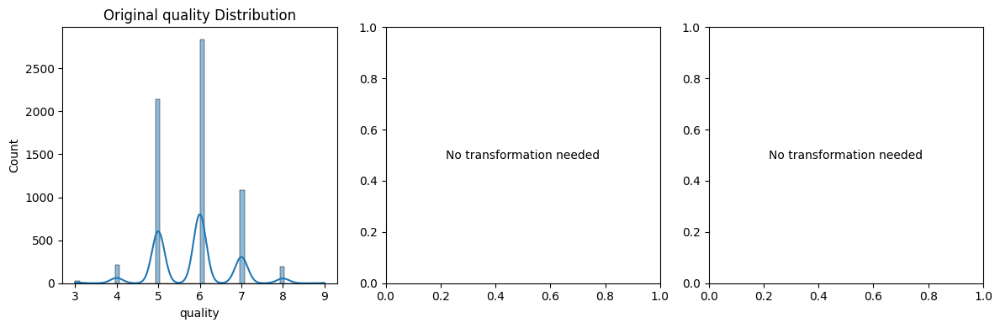

Normalizing Wine Quality data...

--- Preprocessing Abalone Dataset ---
No missing values found.
Encoding categorical variables...
Encoding column: Sex
Handling outliers using IQR method...
Found 49 outliers in column 'Length'
Found 59 outliers in column 'Diameter'
Found 29 outliers in column 'Height'
Found 30 outliers in column 'Whole_weight'
Found 48 outliers in column 'Shucked_weight'
Found 26 outliers in column 'Viscera_weight'
Found 35 outliers in column 'Shell_weight'
Analyzing target variable: Rings
Target skewness: 1.1137
Target is right-skewed. Applying log transformation.
Box-Cox transformation applied with lambda=0.1676


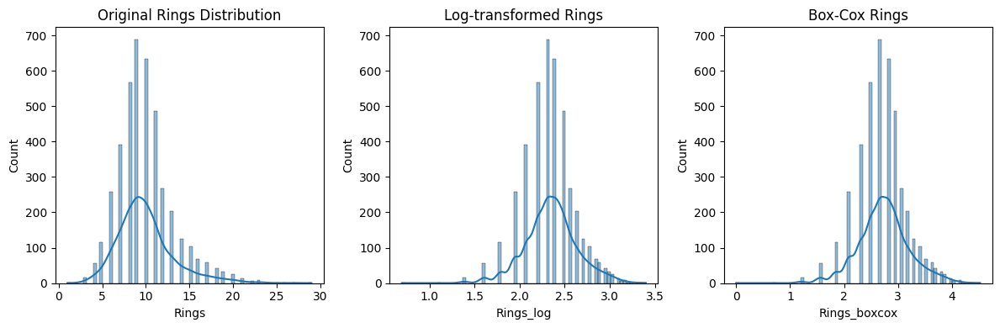

Normalizing Abalone data...
Applying SMOTETomek for balanced dataset...
SMOTETomek failed: 'Series' object has no attribute 'categories'. Using standard scaled data instead.

--- Preprocessing Forest Fires Dataset ---
No missing values found.
Handling outliers using IQR method...
Found 51 outliers in column 'Y'
Found 53 outliers in column 'FFMC'
Found 17 outliers in column 'DMC'
Found 8 outliers in column 'DC'
Found 23 outliers in column 'ISI'
Found 2 outliers in column 'temp'
Found 12 outliers in column 'RH'
Found 13 outliers in column 'wind'
Found 8 outliers in column 'rain'
Found 76 outliers in column 'month_num'
The target 'area' in Forest Fires dataset often has many zeros and a long tail.
Applying log(x+1) transformation as suggested by the dataset authors.


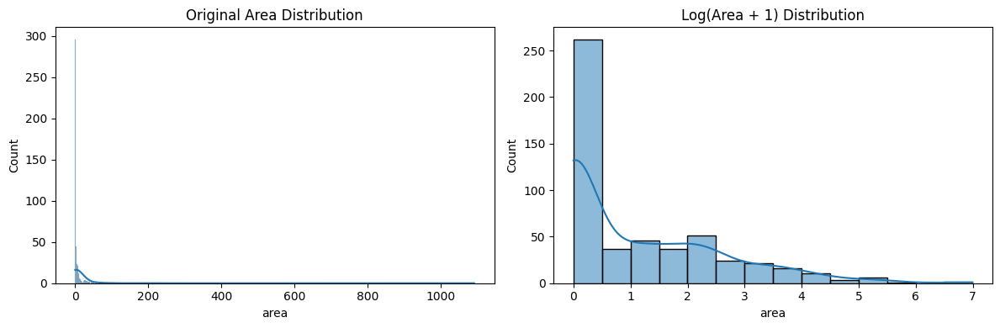

Normalizing Forest Fires data...
Applying SMOTETomek for balanced dataset...
SMOTETomek failed: 'Series' object has no attribute 'categories'. Using standard scaled data instead.
Setting up 5-fold cross-validation...

--- All datasets loaded and preprocessed successfully! ---

Wine Quality Dataset:
  - X shape: (6497, 12)
  - y shape: (6497,)
  - Transform type: none

Abalone Dataset:
  - X shape: (4177, 9)
  - y shape: (4177,)
  - Transform type: boxcox

Forest Fires Dataset:
  - X shape: (517, 12)
  - y shape: (517,)
  - Transform type: log

STEP 4: RUNNING REGRESSION MODELS
--------------------------------------------------

Running regression models on Wine Quality dataset

Tuning hyperparameters for Wine Quality dataset...

Tuning k-NN hyperparameters...
Best k-NN Parameters: {'n_neighbors': 11, 'p': 2, 'weights': 'distance'}
Best k-NN RMSE: 0.7282

Tuning Decision Tree hyperparameters...
Best Decision Tree Parameters: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2

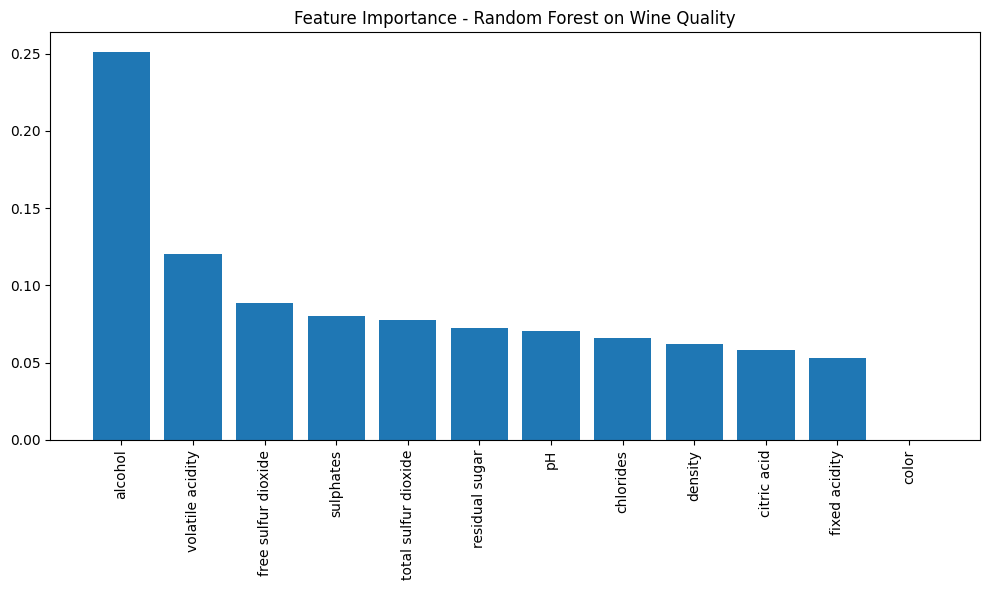

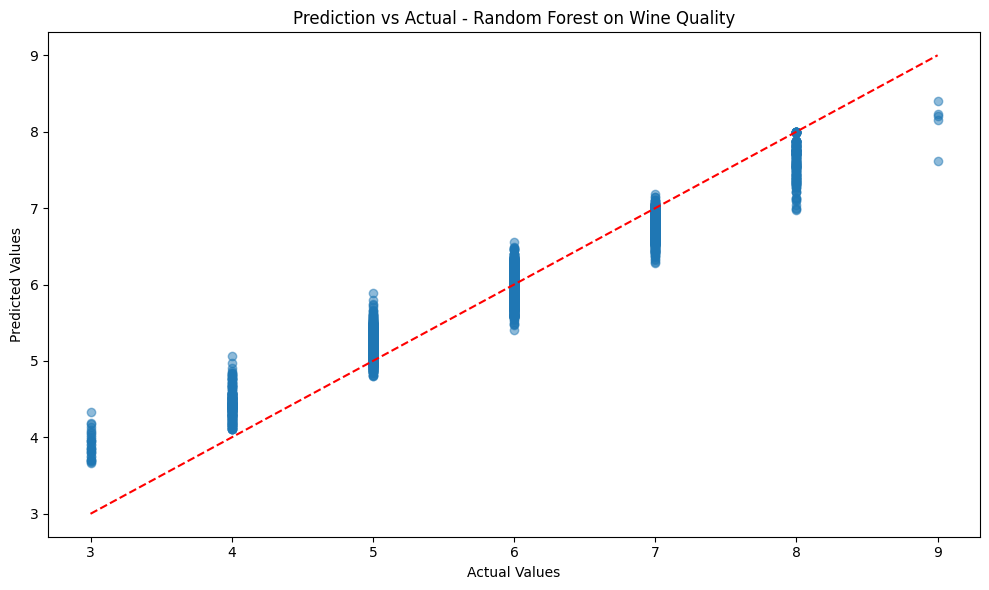

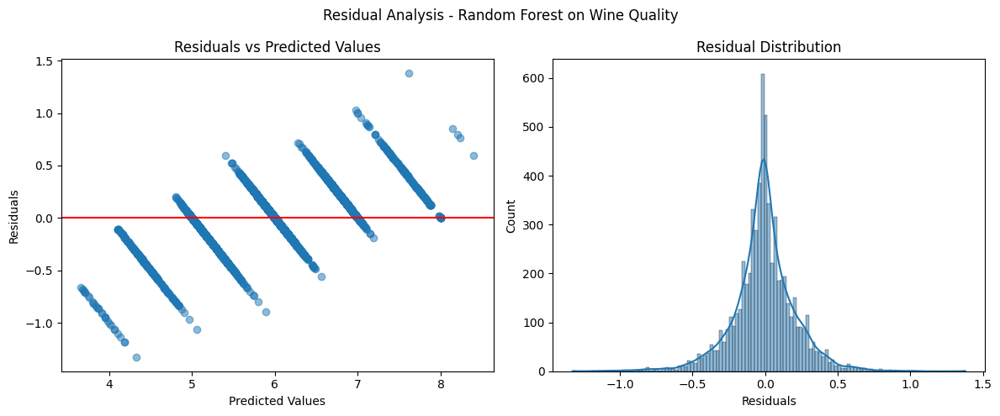


Running regression models on Abalone dataset

Tuning hyperparameters for Abalone dataset...

Tuning k-NN hyperparameters...
Best k-NN Parameters: {'n_neighbors': 9, 'p': 2, 'weights': 'distance'}
Best k-NN RMSE: 2.3104

Tuning Decision Tree hyperparameters...
Best Decision Tree Parameters: {'max_depth': 5, 'min_samples_leaf': 4, 'min_samples_split': 10}
Best Decision Tree RMSE: 2.4882

Tuning Random Forest hyperparameters...
Best Random Forest Parameters: {'max_depth': 20, 'min_samples_split': 10, 'n_estimators': 150}
Best Random Forest RMSE: 2.2630

Tuning Gradient Boosting hyperparameters...
Best Gradient Boosting Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.8}
Best Gradient Boosting RMSE: 2.2586

Tuning XGBoost hyperparameters...
Best XGBoost Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}
Best XGBoost RMSE: 2.2217

Evaluating k-NN on Abalone dataset...
  Fold 1 - RMSE: 2.2871, MAE: 1.6040, R²: 0.516

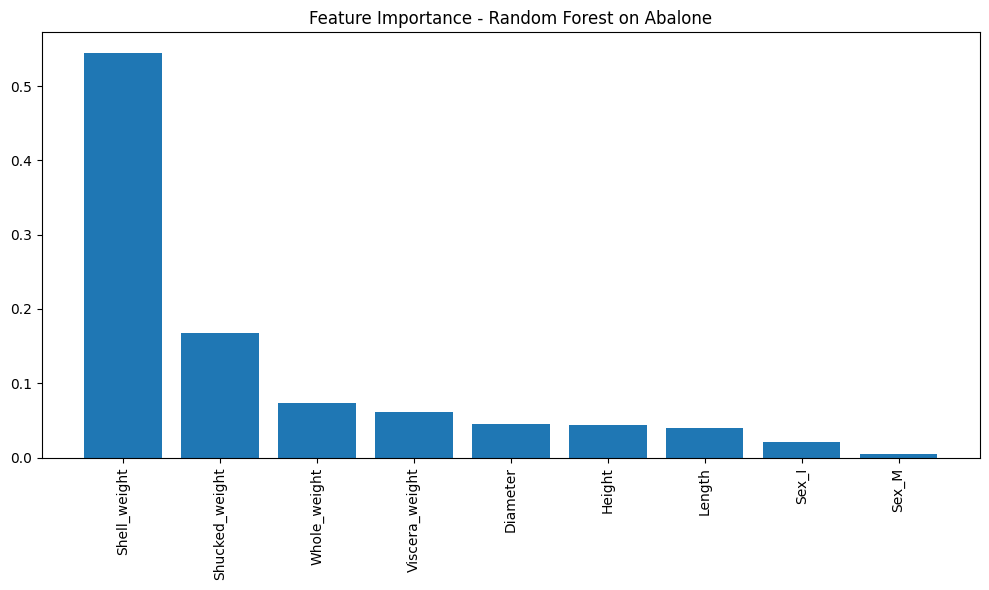

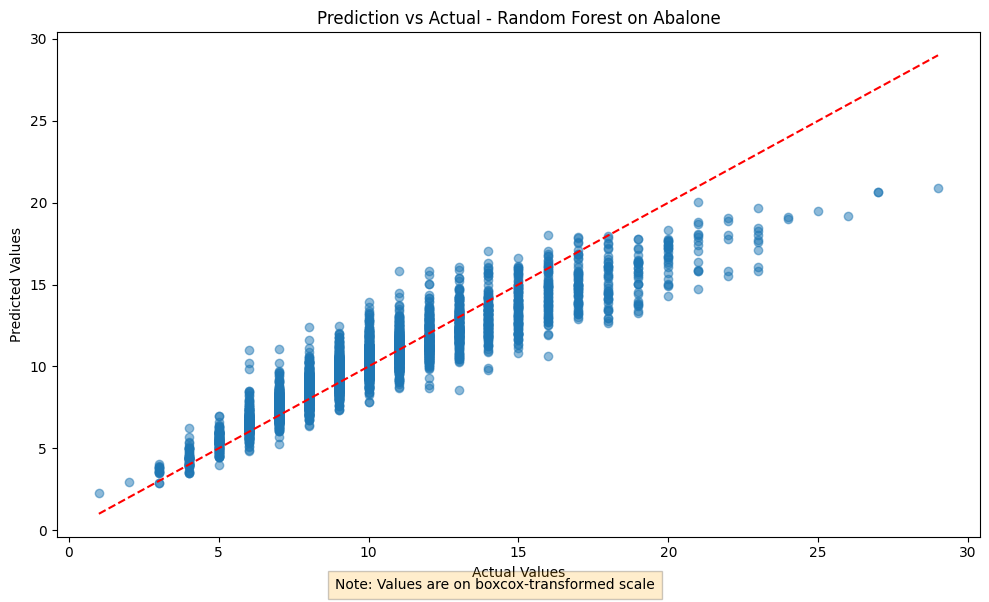

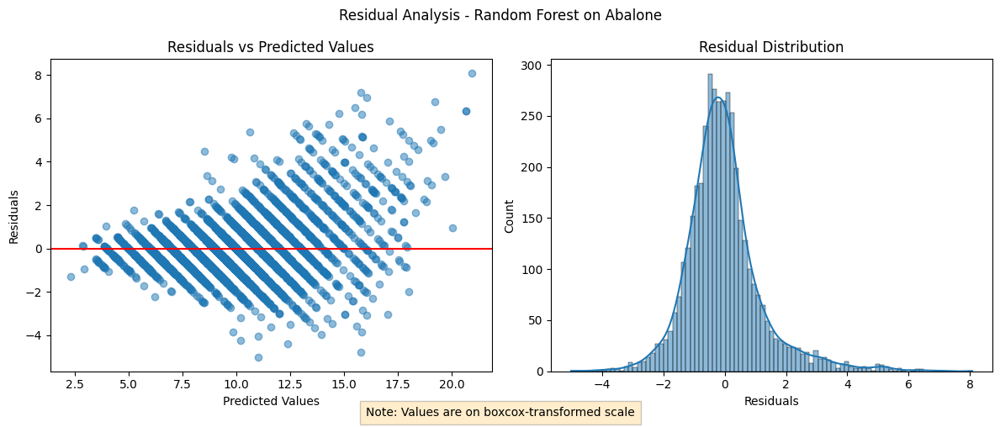


Running regression models on Forest Fires dataset

Tuning hyperparameters for Forest Fires dataset...

Tuning k-NN hyperparameters...
Best k-NN Parameters: {'n_neighbors': 11, 'p': 2, 'weights': 'uniform'}
Best k-NN RMSE: 1.4266

Tuning Decision Tree hyperparameters...
Best Decision Tree Parameters: {'max_depth': 5, 'min_samples_leaf': 4, 'min_samples_split': 2}
Best Decision Tree RMSE: 1.5604

Tuning Random Forest hyperparameters...
Best Random Forest Parameters: {'max_depth': 10, 'min_samples_split': 5, 'n_estimators': 150}
Best Random Forest RMSE: 1.4189

Tuning Gradient Boosting hyperparameters...
Best Gradient Boosting Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 50, 'subsample': 0.8}
Best Gradient Boosting RMSE: 1.3950

Tuning XGBoost hyperparameters...
Best XGBoost Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 50, 'subsample': 0.8}
Best XGBoost RMSE: 1.3920

Evaluating k-NN on Forest Fires dataset...
  Fold 1 - RMSE: 1.5267, MAE: 1.2

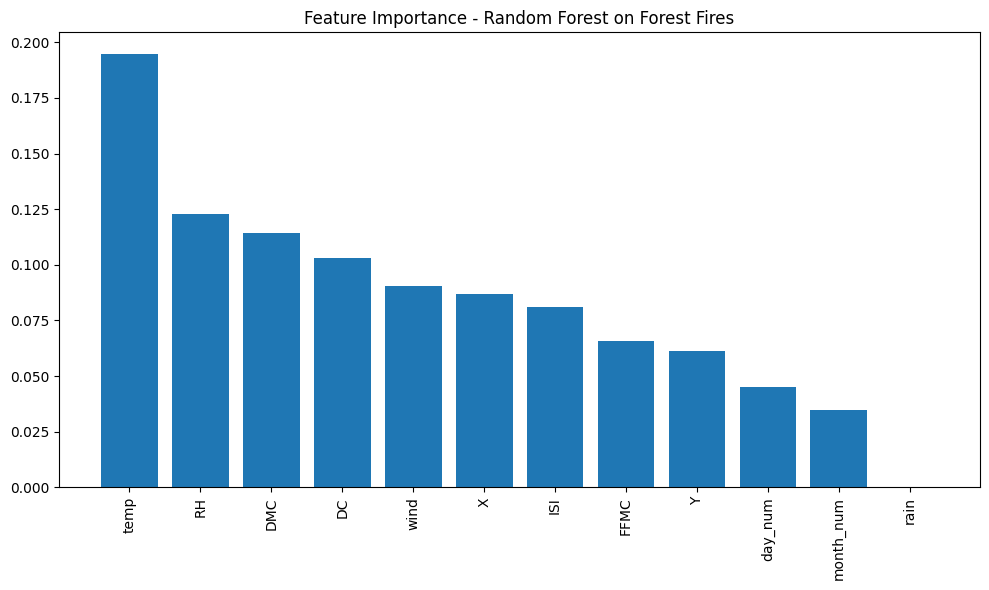

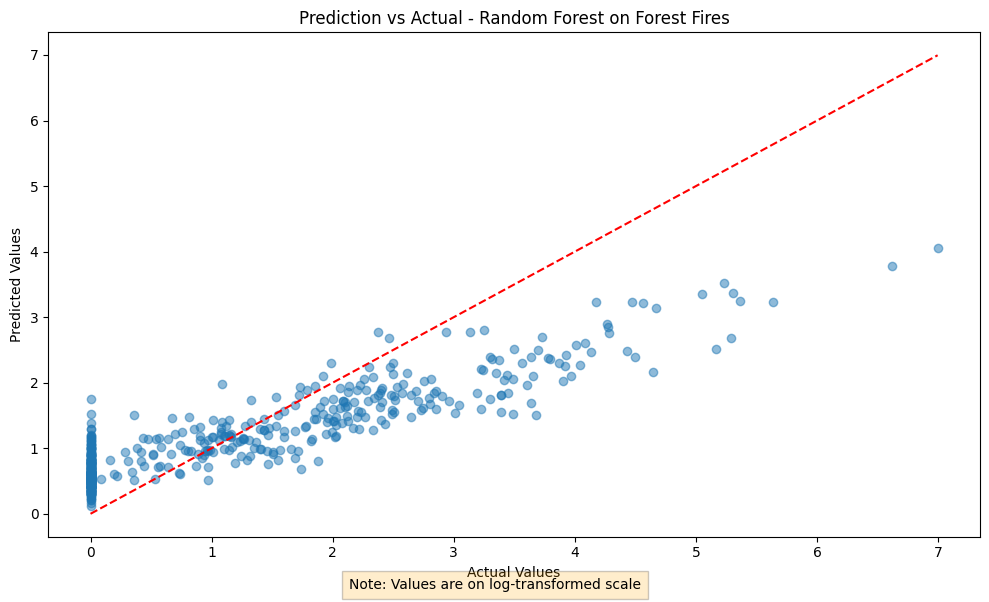

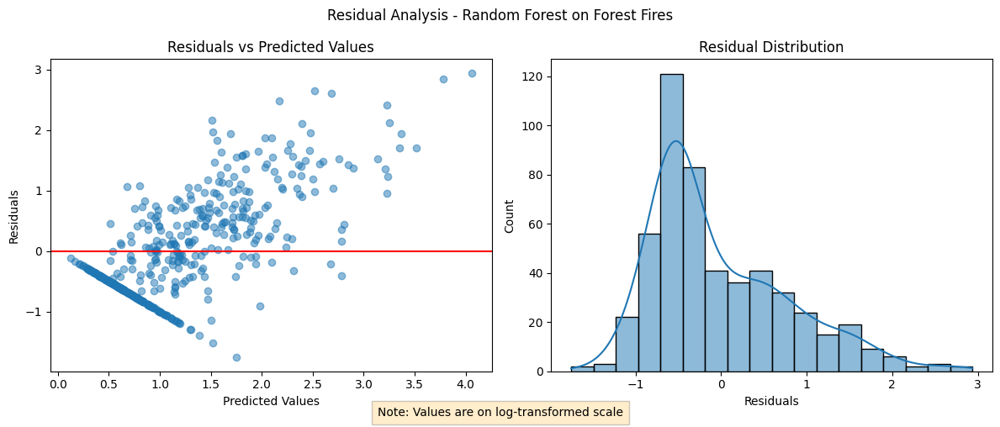



SUMMARY TABLE OF REGRESSION RESULTS
     Dataset             Model  RMSE_value            RMSE             MAE               R² Training Time (s) Transform
Wine Quality              k-NN    0.615012 0.6150 ± 0.0041 0.4021 ± 0.0050  0.5036 ± 0.0105            0.0083      none
Wine Quality     Decision Tree    0.734642 0.7346 ± 0.0078 0.5693 ± 0.0108  0.2915 ± 0.0235            0.0200      none
Wine Quality     Random Forest    0.606359 0.6064 ± 0.0042 0.4324 ± 0.0057  0.5174 ± 0.0126            4.6719      none
Wine Quality Gradient Boosting    0.665941 0.6659 ± 0.0089 0.5177 ± 0.0085  0.4179 ± 0.0155            0.7576      none
Wine Quality           XGBoost    0.652277 0.6523 ± 0.0092 0.5015 ± 0.0065  0.4415 ± 0.0164            0.1606      none
     Abalone              k-NN    2.239434 2.2394 ± 0.1522 1.5692 ± 0.0740  0.5145 ± 0.0101            0.0072    boxcox
     Abalone     Decision Tree    2.317982 2.3180 ± 0.1415 1.6319 ± 0.0588  0.4786 ± 0.0288            0.0151    boxcox
  

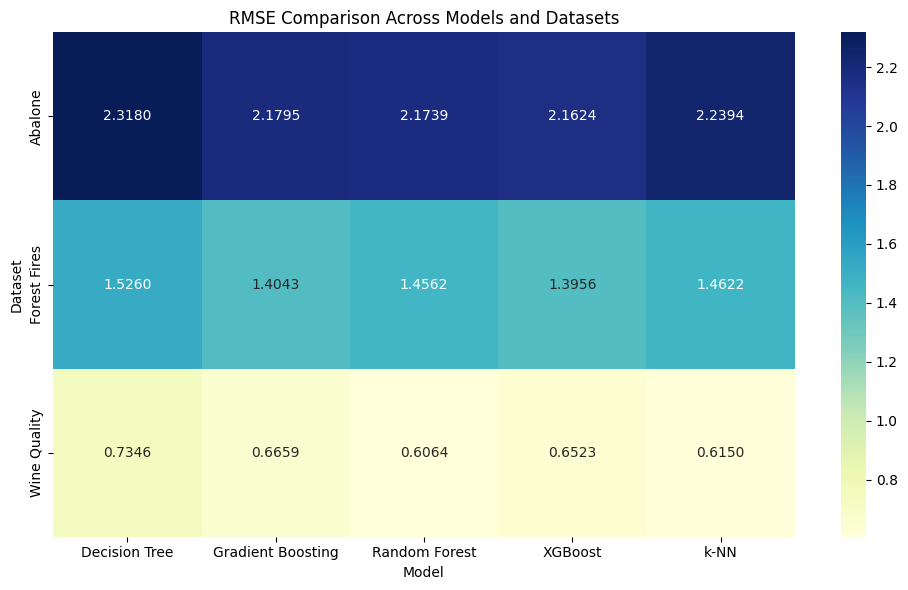



Complete analysis finished in 617.73 seconds

Analysis complete! Datasets and results are available for further exploration.


In [5]:
# Import from previous steps
# Additional imports
import matplotlib.pyplot as plt
import time

# Set random seed for reproducibility
import numpy as np
np.random.seed(42)

# Main function to run the complete analysis
def run_complete_analysis():
    """
    Run complete analysis by combining Step 3 and Step 4
    """
    print("="*80)
    print("RUNNING COMPLETE REGRESSION ANALYSIS FOR ECE 657A ASSIGNMENT 2")
    print("="*80)

    # Start timer
    start_time = time.time()

    # Step 3: Load and preprocess datasets
    print("\nSTEP 3: LOADING AND PREPROCESSING DATASETS")
    print("-"*50)
    datasets = load_and_preprocess_all_datasets()

    # Step 4: Run regression models
    print("\nSTEP 4: RUNNING REGRESSION MODELS")
    print("-"*50)
    results = run_regression_analysis(datasets)

    # End timer
    total_time = time.time() - start_time

    print("\n")
    print("="*80)
    print(f"Complete analysis finished in {total_time:.2f} seconds")
    print("="*80)

    return datasets, results

if __name__ == "__main__":
    # Run complete analysis
    datasets, results = run_complete_analysis()

    print("\nAnalysis complete! Datasets and results are available for further exploration.")

In [16]:
# Import additional necessary libraries
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

# Function to apply t-SNE and visualize the dataset
def apply_tsne(X, y, dataset_name):
    """
    Apply t-SNE and create a 2D visualization

    Parameters:
    X (array): Feature matrix
    y (array): Target values
    dataset_name (str): Name of the dataset
    """
    print(f"\nApplying t-SNE to {dataset_name} dataset...")

    # Apply t-SNE
    tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, len(X)//5))
    X_tsne = tsne.fit_transform(X)

    # Visualize results
    plt.figure(figsize=(10, 8))

    # Create a colormap based on target values
    scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y, cmap='viridis', alpha=0.7)
    plt.colorbar(scatter, label='Target Value')

    plt.title(f't-SNE Visualization of {dataset_name} Dataset')
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')
    plt.tight_layout()
    plt.show()

    # Return t-SNE transformation for potential further use
    return tsne, X_tsne

# Function to apply PCA and analyze the results
def apply_pca(X, y, feature_names, dataset_name, create_reduced=True):
    """
    Apply PCA, visualize components and explained variance

    Parameters:
    X (array): Feature matrix
    y (array): Target values
    feature_names (array): Names of features
    dataset_name (str): Name of the dataset
    create_reduced (bool): Whether to create reduced dataset

    Returns:
    tuple: (pca model, transformed data, optimal n_components)
    """
    print(f"\nApplying PCA to {dataset_name} dataset...")

    # Initialize PCA without limiting components
    pca = PCA()
    X_pca_full = pca.fit_transform(X)

    # Plot explained variance ratio
    plt.figure(figsize=(12, 5))

    # Scree plot
    plt.subplot(1, 2, 1)
    plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o')
    plt.axhline(y=0.9, color='r', linestyle='-', alpha=0.5)  # 90% variance line
    plt.xlabel('Number of Components')
    plt.ylabel('Cumulative Explained Variance')
    plt.title('Scree Plot - Explained Variance vs. Components')
    plt.grid(True)

    # Individual variance contribution
    plt.subplot(1, 2, 2)
    plt.bar(range(len(pca.explained_variance_ratio_)), pca.explained_variance_ratio_)
    plt.xlabel('Principal Component')
    plt.ylabel('Explained Variance Ratio')
    plt.title('Individual Component Contribution')
    plt.tight_layout()
    plt.show()

    # Determine optimal number of components that explain 90% variance
    cumsum = np.cumsum(pca.explained_variance_ratio_)
    n_components_90 = np.argmax(cumsum >= 0.9) + 1
    print(f"Number of components explaining 90% variance: {n_components_90}")

    # Feature importance in the first two components
    plt.figure(figsize=(14, 6))
    components = pd.DataFrame(pca.components_.T, index=feature_names)

    # Plot first component
    plt.subplot(1, 2, 1)
    sns.barplot(x=components.index, y=components[0])
    plt.title('PCA Component 1 Feature Contributions')
    plt.xticks(rotation=90)

    # Plot second component
    plt.subplot(1, 2, 2)
    sns.barplot(x=components.index, y=components[1])
    plt.title('PCA Component 2 Feature Contributions')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

    # Visualize first two components with target values
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(X_pca_full[:, 0], X_pca_full[:, 1], c=y, cmap='viridis', alpha=0.7)
    plt.colorbar(scatter, label='Target Value')
    plt.title(f'PCA Components 1 vs 2 - {dataset_name} Dataset')
    plt.xlabel('PC1')
    plt.ylabel('PC2')
    plt.tight_layout()
    plt.show()

    # Create reduced dataset if requested
    if create_reduced:
        # Re-initialize PCA with optimal components
        pca_reduced = PCA(n_components=n_components_90)
        X_pca_reduced = pca_reduced.fit_transform(X)
        return pca_reduced, X_pca_reduced, n_components_90

    return pca, X_pca_full, n_components_90

# Function to apply LDA (replacing UMAP function)
def apply_lda(X, y, dataset_name, feature_names, create_reduced=True):
    """
    Apply LDA for dimensionality reduction and visualization

    Parameters:
    X (array): Feature matrix
    y (array): Target values
    dataset_name (str): Name of the dataset
    feature_names (array): Names of features
    create_reduced (bool): Whether to create reduced dataset

    Returns:
    tuple: (lda model, transformed data, n_components)
    """
    print(f"\nApplying LDA to {dataset_name} dataset...")

    # For regression, we need to bin the target values since LDA requires categorical targets
    # Create bins for target values
    n_bins = min(10, len(np.unique(y)))  # Limit to 10 bins or unique values
    y_binned = pd.qcut(y, n_bins, labels=False, duplicates='drop')

    # Visualize with 2 components if possible (min of n_features and n_classes-1)
    n_classes = len(np.unique(y_binned))
    n_features = X.shape[1]
    n_components_viz = min(2, min(n_features, n_classes-1))

    if n_components_viz < 1:
        print("Warning: Cannot apply LDA for visualization - not enough classes or features")
        return None, X, X.shape[1]  # Return original data

    # Apply LDA for visualization
    lda_viz = LinearDiscriminantAnalysis(n_components=n_components_viz)
    X_lda_viz = lda_viz.fit_transform(X, y_binned)

    # Plot the LDA components
    if n_components_viz >= 2:
        plt.figure(figsize=(10, 8))
        scatter = plt.scatter(X_lda_viz[:, 0], X_lda_viz[:, 1], c=y, cmap='viridis', alpha=0.7)
        plt.colorbar(scatter, label='Target Value')
        plt.title(f'LDA Visualization of {dataset_name} Dataset')
        plt.xlabel('LDA Component 1')
        plt.ylabel('LDA Component 2')
        plt.tight_layout()
        plt.show()
    elif n_components_viz == 1:
        plt.figure(figsize=(10, 6))
        plt.scatter(X_lda_viz[:, 0], np.zeros_like(X_lda_viz[:, 0]), c=y, cmap='viridis', alpha=0.7)
        plt.colorbar(label='Target Value')
        plt.title(f'LDA Component 1 of {dataset_name} Dataset')
        plt.xlabel('LDA Component 1')
        plt.yticks([])
        plt.tight_layout()
        plt.show()

    # If we want to create a reduced dataset
    if create_reduced:
        # Determine optimal number of components
        # In LDA, n_components is limited by min(n_features, n_classes-1)
        max_possible_components = min(n_features, n_classes-1)

        # For LDA, let's try different numbers of components and evaluate
        best_score = float('inf')
        best_n_components = 1

        # Try different numbers of components up to max possible
        for n_components in range(1, min(5, max_possible_components + 1)):
            # Skip if we can't have that many components
            if n_components > max_possible_components:
                continue

            # Fit LDA with current n_components
            lda_model = LinearDiscriminantAnalysis(n_components=n_components)
            X_lda = lda_model.fit_transform(X, y_binned)

            # Evaluate using a simple model (KNN regressor)
            knn = KNeighborsRegressor(n_neighbors=5)
            scores = cross_val_score(knn, X_lda, y, cv=5,
                                    scoring='neg_root_mean_squared_error')
            avg_score = -np.mean(scores)

            if avg_score < best_score:
                best_score = avg_score
                best_n_components = n_components

        print(f"Best LDA n_components: {best_n_components}")

        # Fit final LDA model with best parameters
        lda_reduced = LinearDiscriminantAnalysis(n_components=best_n_components)
        X_lda_reduced = lda_reduced.fit_transform(X, y_binned)

        # Calculate explained variance ratio (not directly available in LDA like PCA)
        # We can use the eigenvalues to approximate the explained variance
        explained_variance_ratio = lda_reduced.explained_variance_ratio_ if hasattr(lda_reduced, 'explained_variance_ratio_') else None

        if explained_variance_ratio is not None:
            # Plot explained variance
            plt.figure(figsize=(8, 5))
            plt.bar(range(len(explained_variance_ratio)), explained_variance_ratio)
            plt.xlabel('LDA Component')
            plt.ylabel('Explained Variance Ratio')
            plt.title('LDA Component Contribution')
            plt.tight_layout()
            plt.show()

        # Feature importance if available
        if hasattr(lda_reduced, 'coef_') and lda_reduced.coef_ is not None:
            plt.figure(figsize=(14, 6))
            components = pd.DataFrame(lda_reduced.coef_.T, index=feature_names)

            # Plot first component
            plt.subplot(1, 2, 1)
            sns.barplot(x=components.index, y=components[0])
            plt.title('LDA Component 1 Feature Contributions')
            plt.xticks(rotation=90)

            if components.shape[1] > 1:
                # Plot second component if available
                plt.subplot(1, 2, 2)
                sns.barplot(x=components.index, y=components[1])
                plt.title('LDA Component 2 Feature Contributions')
                plt.xticks(rotation=90)

            plt.tight_layout()
            plt.show()

        return lda_reduced, X_lda_reduced, best_n_components

    return lda_viz, X_lda_viz, n_components_viz

# Function to run representation learning on all datasets
def apply_representation_learning(datasets):
    """
    Apply representation learning techniques to all datasets

    Parameters:
    datasets (dict): Dictionary with preprocessed datasets

    Returns:
    dict: Dictionary with reduced datasets
    """
    # Dictionary to store reduced datasets
    reduced_datasets = {}

    # Initialize datasets
    dataset_keys = ['wine', 'abalone', 'forest_fires']
    cv = datasets['cv']
    reduced_datasets['cv'] = cv

    # For each dataset
    for dataset_key in dataset_keys:
        print(f"\n{'='*50}")
        print(f"Applying representation learning on {datasets[dataset_key]['name']} dataset")
        print(f"{'='*50}")

        # Get dataset
        X = datasets[dataset_key]['X']
        y = datasets[dataset_key]['y']
        feature_names = datasets[dataset_key]['feature_names']
        dataset_name = datasets[dataset_key]['name']
        transform_type = datasets[dataset_key]['transform_type']

        # Apply t-SNE for visualization
        _, _ = apply_tsne(X, y, dataset_name)

        # Apply PCA
        pca_model, X_pca, pca_components = apply_pca(X, y, feature_names, dataset_name)

        # Apply UMAP
        lda_model, X_lda, lda_components = apply_lda(X, y, dataset_name, feature_names)

        # Store original dataset (already in datasets)

        # Store PCA-reduced dataset
        reduced_datasets[f"{dataset_key}_pca"] = {
            'name': f"{dataset_name} (PCA)",
            'X': X_pca,
            'y': y,
            'feature_names': [f"PC{i+1}" for i in range(X_pca.shape[1])],
            'transform_type': transform_type,
            'reduction_method': 'PCA',
            'n_components': pca_components
        }

        # Store LDA-reduced dataset
        reduced_datasets[f"{dataset_key}_lda"] = {
            'name': f"{dataset_name} (LDA)",
            'X': X_lda,
            'y': y,
            'feature_names': [f"LDA{i+1}" for i in range(X_lda.shape[1])],
            'transform_type': transform_type,
            'reduction_method': 'LDA',
            'n_components': lda_components
        }

    return reduced_datasets

# Function to run regression on original and reduced datasets
def compare_regression_on_reduced_datasets(datasets, reduced_datasets):
    """
    Compare regression performance on original and reduced datasets

    Parameters:
    datasets (dict): Dictionary with original datasets
    reduced_datasets (dict): Dictionary with reduced datasets

    Returns:
    dict: Dictionary with all results
    """
    # Dictionary to store all results
    all_results = {}

    # Combine original and reduced datasets
    combined_datasets = {}
    combined_datasets.update(datasets)
    combined_datasets.update(reduced_datasets)

    # Get cross-validator
    cv = datasets['cv']

    # List of dataset keys to evaluate (original and reduced)
    dataset_keys = []
    for key in ['wine', 'abalone', 'forest_fires']:
        dataset_keys.append(key)  # Original
        dataset_keys.append(f"{key}_pca")  # PCA-reduced
        dataset_keys.append(f"{key}_umap")  # UMAP-reduced

    # For each dataset
    for dataset_key in dataset_keys:
        if dataset_key not in combined_datasets or dataset_key == 'cv':
            continue

        print(f"\n{'='*50}")
        print(f"Running regression models on {combined_datasets[dataset_key]['name']} dataset")
        print(f"{'='*50}")

        # Get dataset
        X = combined_datasets[dataset_key]['X']
        y = combined_datasets[dataset_key]['y']

        # Extract or generate feature names
        if 'feature_names' in combined_datasets[dataset_key]:
            feature_names = combined_datasets[dataset_key]['feature_names']
        else:
            feature_names = [f"Feature_{i+1}" for i in range(X.shape[1])]

        transform_type = combined_datasets[dataset_key]['transform_type']
        dataset_name = combined_datasets[dataset_key]['name']

        # For reduced datasets, use simplified tuning to speed up the process
        # Since our focus is comparing the representations, not finding the best hyperparameters

        # Configure models with default or simplified hyperparameters
        knn = configure_knn(n_neighbors=5, weights='uniform', p=2)
        dt = configure_decision_tree(max_depth=10, min_samples_split=2, min_samples_leaf=1)
        rf = configure_random_forest(n_estimators=100, max_depth=None, min_samples_split=2)
        gb = configure_gradient_boosting(n_estimators=100, learning_rate=0.1, max_depth=3, subsample=1.0)
        xgb = configure_xgboost(n_estimators=100, learning_rate=0.1, max_depth=3)

        # Initialize results for this dataset
        dataset_results = []

        # Evaluate models
        knn_result = evaluate_model_cv(knn, X, y, cv, "k-NN", dataset_name, transform_type)
        dt_result = evaluate_model_cv(dt, X, y, cv, "Decision Tree", dataset_name, transform_type)
        rf_result = evaluate_model_cv(rf, X, y, cv, "Random Forest", dataset_name, transform_type)
        gb_result = evaluate_model_cv(gb, X, y, cv, "Gradient Boosting", dataset_name, transform_type)
        xgb_result = evaluate_model_cv(xgb, X, y, cv, "XGBoost", dataset_name, transform_type)

        # Store results
        dataset_results.append(knn_result)
        dataset_results.append(dt_result)
        dataset_results.append(rf_result)
        dataset_results.append(gb_result)

        # Store results for this dataset
        all_results[dataset_key] = dataset_results

    # Create summary table for original vs reduced datasets
    create_reduction_summary_table(all_results, datasets, reduced_datasets)

    return all_results



In [17]:
# Enhanced function to create a comprehensive summary table
def create_reduction_summary_table(all_results, datasets, reduced_datasets):
    """
    Create comprehensive summary table comparing performance on original vs reduced datasets

    Parameters:
    all_results (dict): Dictionary with all results
    """
    print("\n")
    print("="*120)
    print("SUMMARY TABLE OF REGRESSION RESULTS - ORIGINAL VS REDUCED DATASETS")
    print("="*120)

    # Create a list to store all results
    rows = []

    # For each dataset
    for dataset_key, dataset_results in all_results.items():
        # For each model
        for result in dataset_results:
            # Extract dataset base name and reduction method
            if '_' in dataset_key:
                base_name, reduction = dataset_key.split('_', 1)
            else:
                base_name = dataset_key
                reduction = 'original'

            # Add result to rows
            rows.append({
                'Dataset': base_name,
                'Reduction': reduction,
                'Model': result['model_name'],
                'RMSE_value': result['avg_rmse'],
                'RMSE': f"{result['avg_rmse']:.4f}",
                'MAE': f"{result['avg_mae']:.4f}",
                'R²': f"{result['avg_r2']:.4f}",
                'Training Time (s)': f"{result['avg_train_time']:.4f}"
            })

    # Convert to DataFrame
    summary_df = pd.DataFrame(rows)

    # Print summary table
    print(summary_df.to_string(index=False))
    print("\n")

    # Save to CSV
    summary_df.to_csv('regression_results_reduced_datasets.csv', index=False)
    print("Summary table saved to 'regression_results_reduced_datasets.csv'")

    # Create pivot table for easier comparison of RMSE
    pivot_rmse = summary_df.pivot_table(
        index=['Dataset', 'Reduction'],
        columns='Model',
        values='RMSE_value',
        aggfunc='first'
    )

    print("\nRMSE Comparison Table:")
    print(pivot_rmse)

    # Create the comprehensive comparison table as required in the assignment PDF
    # Format: Dataset (orig, -pca, -lda) × Model (k-NN, DT, RF, GB)
    comprehensive_table = pd.pivot_table(
        summary_df,
        values='RMSE_value',
        index=['Dataset', 'Reduction'],
        columns=['Model'],
        aggfunc='first'
    )

    print("\nComprehensive Comparison Table (RMSE):")
    print(comprehensive_table)

    # Create a more visually appealing version with color coding
    plt.figure(figsize=(14, 10))
    sns.heatmap(comprehensive_table, annot=True, cmap='YlGnBu', fmt='.4f')
    plt.title('RMSE Comparison Across Models, Datasets, and Reduction Methods')
    plt.tight_layout()
    plt.savefig('comprehensive_comparison_table.png')
    plt.show()

    # Create bar chart to compare reduction methods
    plt.figure(figsize=(15, 8))

    # Group by Dataset and Reduction, calculate mean RMSE across models
    grouped_data = summary_df.groupby(['Dataset', 'Reduction'])['RMSE'].apply(
        lambda x: np.mean([float(val) for val in x])
    ).reset_index()

    # Create grouped bar chart
    ax = sns.barplot(data=grouped_data, x='Dataset', y='RMSE', hue='Reduction')

    plt.title('Average RMSE by Dataset and Reduction Method')
    plt.ylabel('Average RMSE (across all models)')
    plt.tight_layout()
    plt.savefig('reduction_comparison_chart.png')
    plt.show()

    # Create a table showing the dimensionality reduction achieved
    dim_reduction_data = []

    # Create data for dimensionality reduction table
    for dataset_key in ['wine', 'abalone', 'forest_fires']:
        # Add original dimensions
        if dataset_key in all_results:
            original_dims = datasets[dataset_key]['X'].shape[1]  # Use first model result

            # Add entry for original dataset
            dim_reduction_data.append({
                'Dataset': dataset_key,
                'Method': 'Original',
                'Dimensions': original_dims,
                'Reduction (%)': 0.0
            })

            # Add entry for PCA-reduced dataset
            pca_key = f"{dataset_key}_pca"
            if pca_key in all_results:
                pca_dims = reduced_datasets[pca_key]['X'].shape[1]
                pca_reduction = (original_dims - pca_dims) / original_dims * 100
                dim_reduction_data.append({
                    'Dataset': dataset_key,
                    'Method': 'PCA',
                    'Dimensions': pca_dims,
                    'Reduction (%)': pca_reduction
                })

            # Add entry for LDA-reduced dataset
            lda_key = f"{dataset_key}_lda"
            if lda_key in all_results:
                lda_dims = reduced_datasets[lda_key]['X'].shape[1]
                lda_reduction = (original_dims - lda_dims) / original_dims * 100
                dim_reduction_data.append({
                    'Dataset': dataset_key,
                    'Method': 'LDA',
                    'Dimensions': lda_dims,
                    'Reduction (%)': lda_reduction
                })

    # Create dimensionality reduction table
    dim_reduction_df = pd.DataFrame(dim_reduction_data)

    print("\nDimensionality Reduction Summary:")
    print(dim_reduction_df.to_string(index=False))

    # Calculate performance impact table - how much RMSE changed after reduction
    performance_impact = []

    for dataset_key in ['wine', 'abalone', 'forest_fires']:
        # Calculate baseline RMSE for each model on original dataset
        if dataset_key in all_results:
            base_results = {result['model_name']: float(result['avg_rmse']) for result in all_results[dataset_key]}

            # Calculate RMSE changes for PCA
            pca_key = f"{dataset_key}_pca"
            if pca_key in all_results:
                for result in all_results[pca_key]:
                    model_name = result['model_name']
                    if model_name in base_results:
                        baseline_rmse = base_results[model_name]
                        pca_rmse = float(result['avg_rmse'])
                        pct_change = (pca_rmse - baseline_rmse) / baseline_rmse * 100

                        performance_impact.append({
                            'Dataset': dataset_key,
                            'Model': model_name,
                            'Method': 'PCA',
                            'Original RMSE': f"{baseline_rmse:.4f}",
                            'Reduced RMSE': f"{pca_rmse:.4f}",
                            'Change (%)': f"{pct_change:.2f}"
                        })

            # Calculate RMSE changes for LDA
            lda_key = f"{dataset_key}_lda"
            if lda_key in all_results:
                for result in all_results[lda_key]:
                    model_name = result['model_name']
                    if model_name in base_results:
                        baseline_rmse = base_results[model_name]
                        lda_rmse = float(result['avg_rmse'])
                        pct_change = (lda_rmse - baseline_rmse) / baseline_rmse * 100

                        performance_impact.append({
                            'Dataset': dataset_key,
                            'Model': model_name,
                            'Method': 'LDA',
                            'Original RMSE': f"{baseline_rmse:.4f}",
                            'Reduced RMSE': f"{lda_rmse:.4f}",
                            'Change (%)': f"{pct_change:.2f}"
                        })

    # Create performance impact table
    impact_df = pd.DataFrame(performance_impact)

    print("\nPerformance Impact of Dimensionality Reduction:")
    print(impact_df.to_string(index=False))

    # Save all tables to CSV for inclusion in the report
    dim_reduction_df.to_csv('dimensionality_reduction_summary.csv', index=False)
    impact_df.to_csv('performance_impact_summary.csv', index=False)
    comprehensive_table.to_csv('comprehensive_comparison.csv')

    print("\nAll summary tables have been saved to CSV files for inclusion in your report.")



Applying representation learning on Wine Quality dataset

Applying t-SNE to Wine Quality dataset...


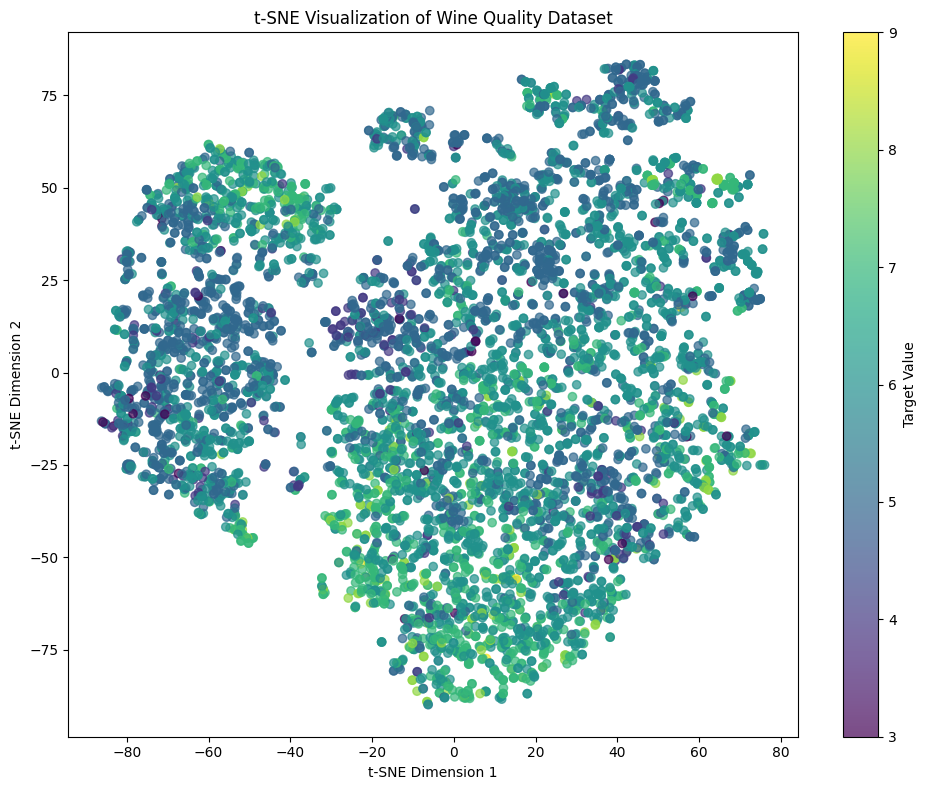


Applying PCA to Wine Quality dataset...


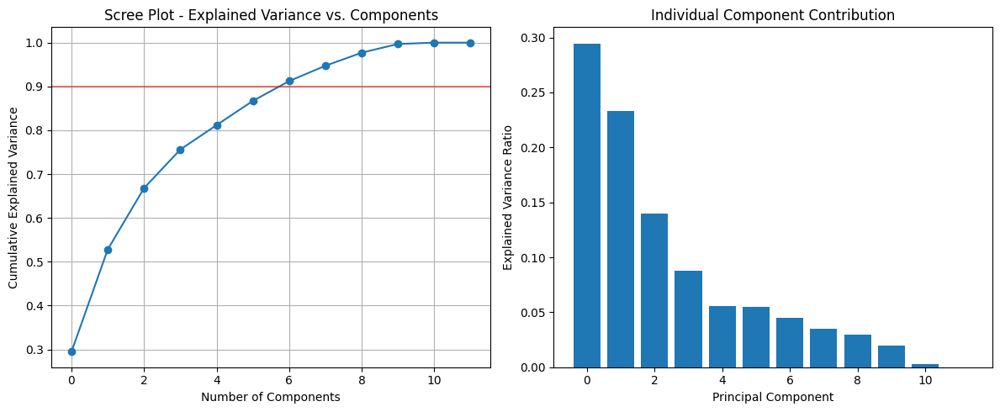

Number of components explaining 90% variance: 7


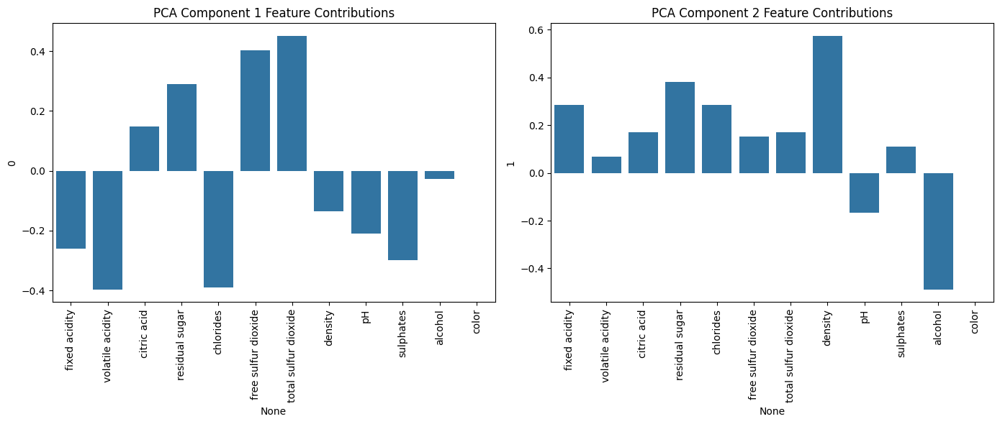

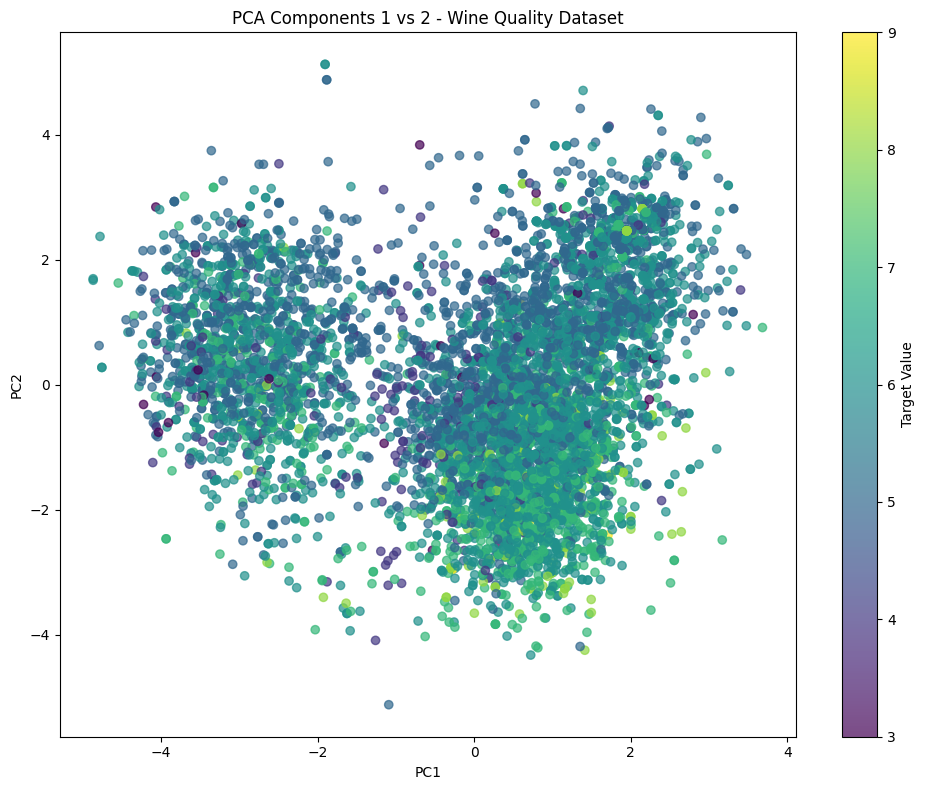


Applying LDA to Wine Quality dataset...


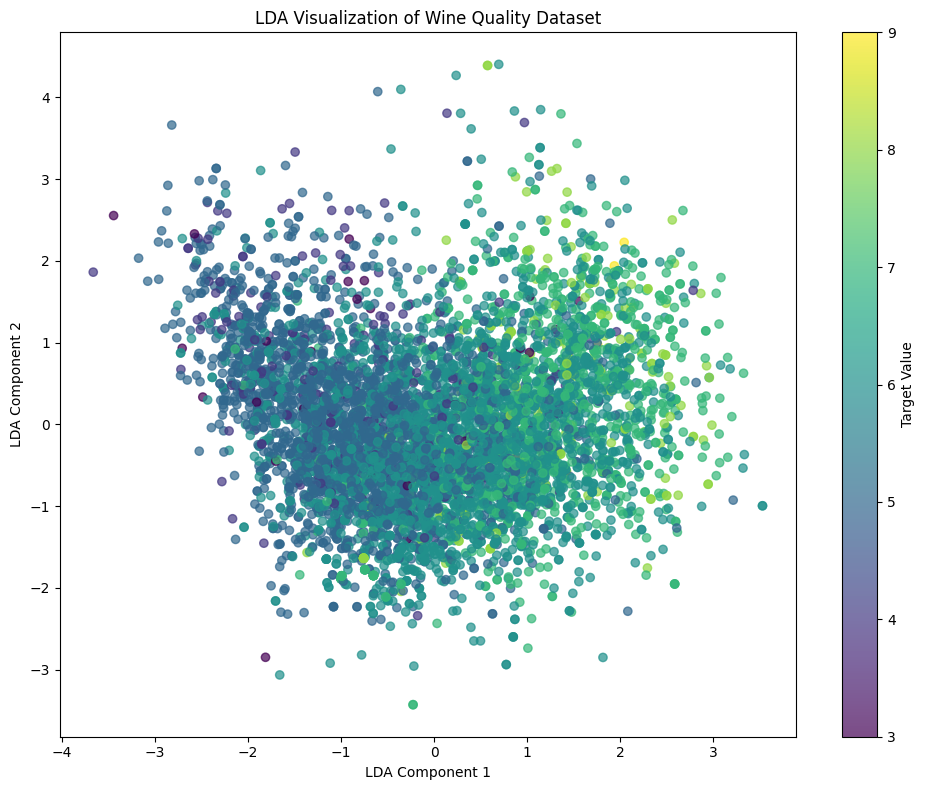

Best LDA n_components: 3


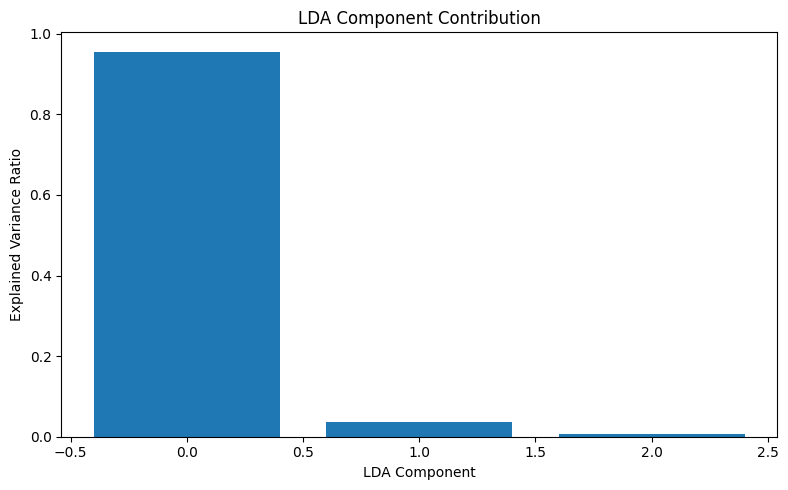

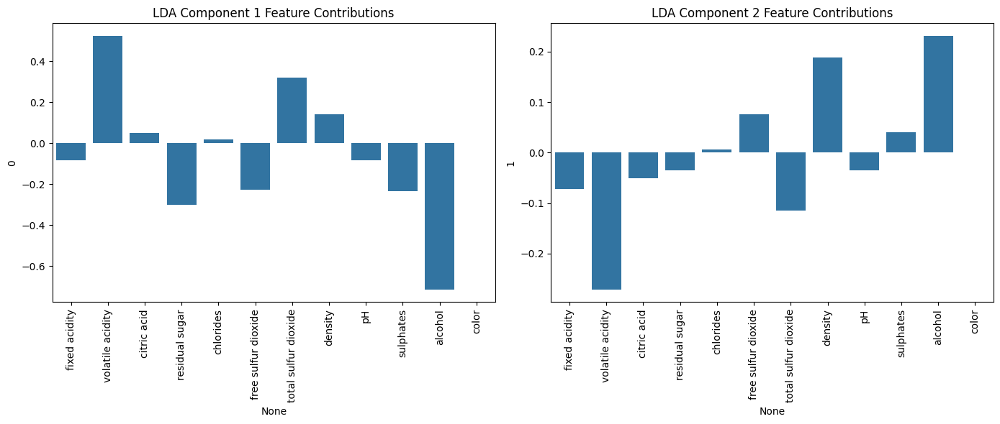


Applying representation learning on Abalone dataset

Applying t-SNE to Abalone dataset...


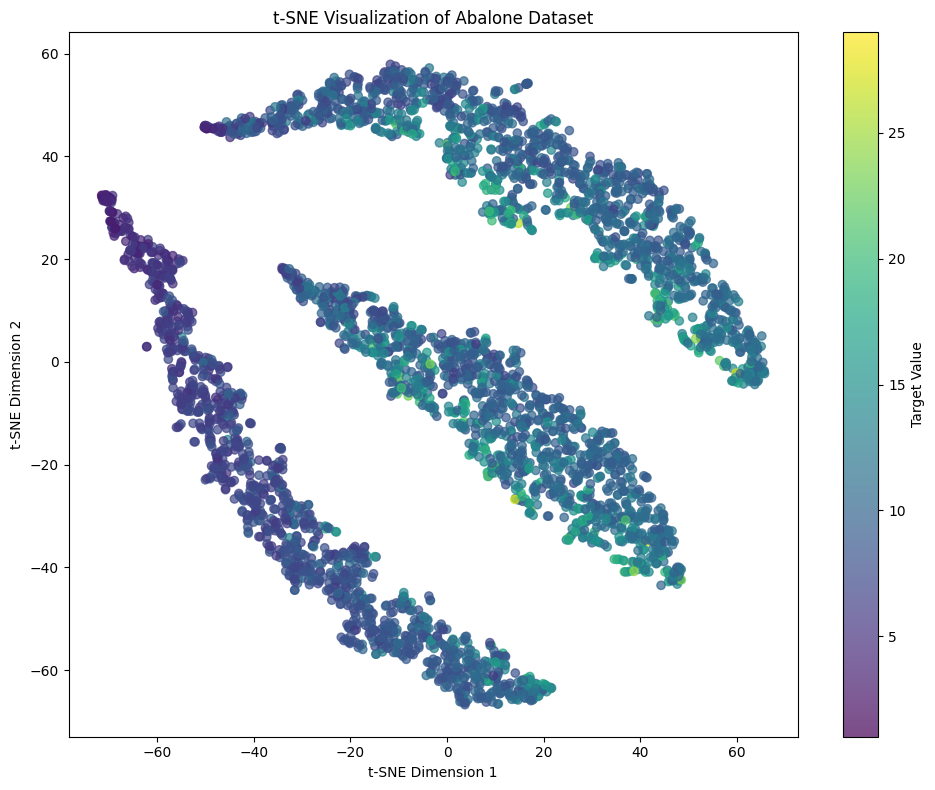


Applying PCA to Abalone dataset...


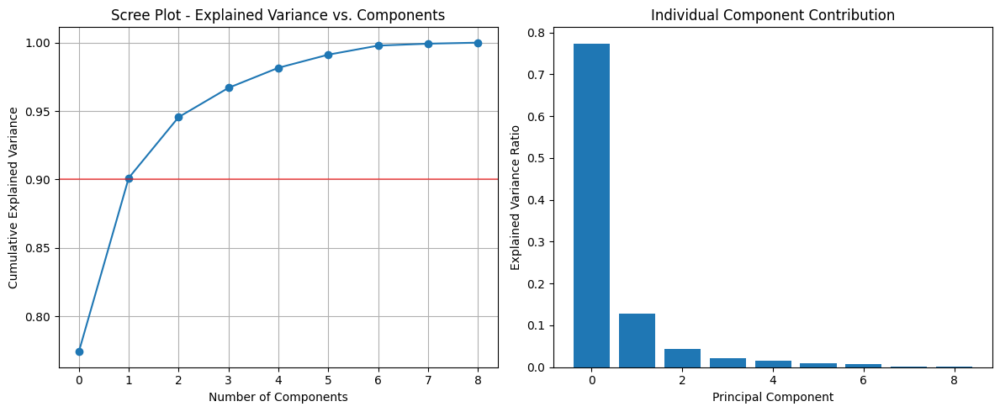

Number of components explaining 90% variance: 2


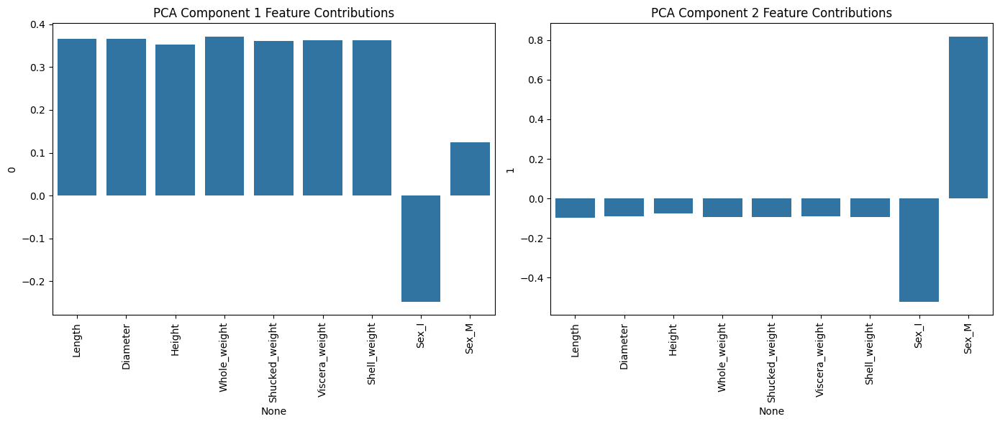

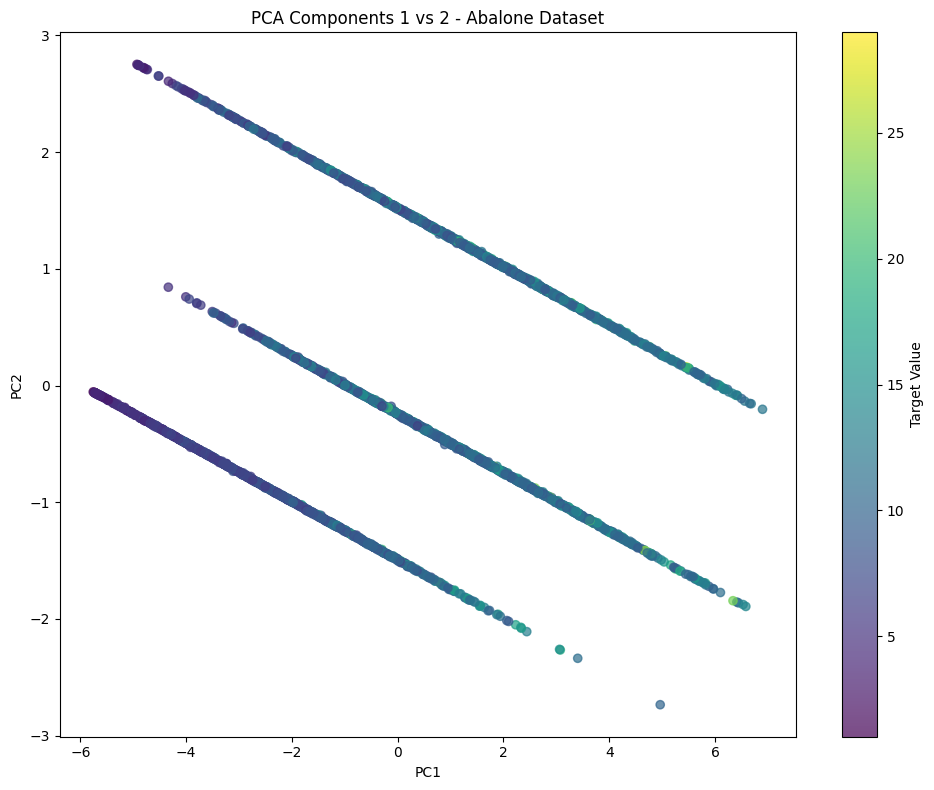


Applying LDA to Abalone dataset...


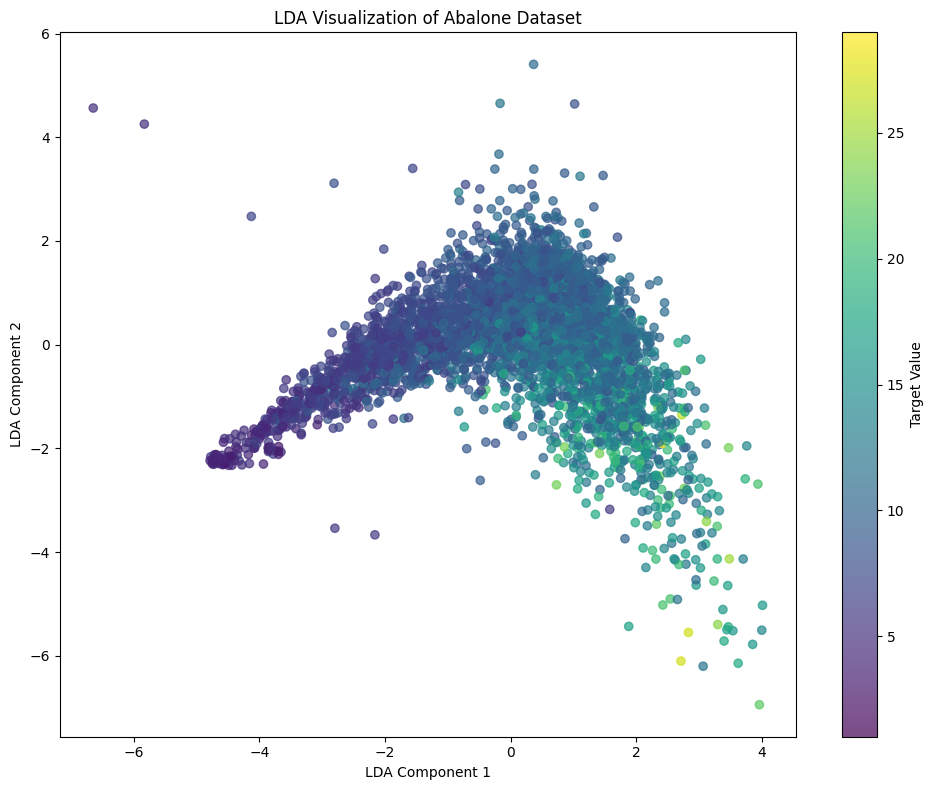

Best LDA n_components: 4


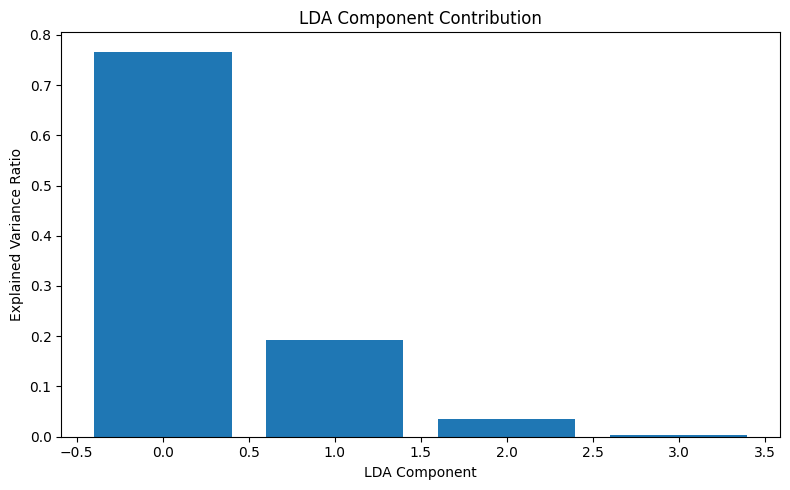

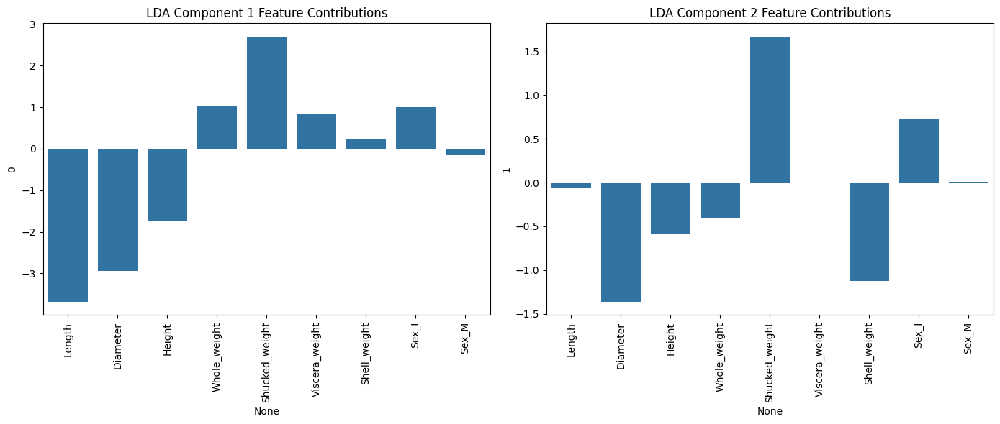


Applying representation learning on Forest Fires dataset

Applying t-SNE to Forest Fires dataset...


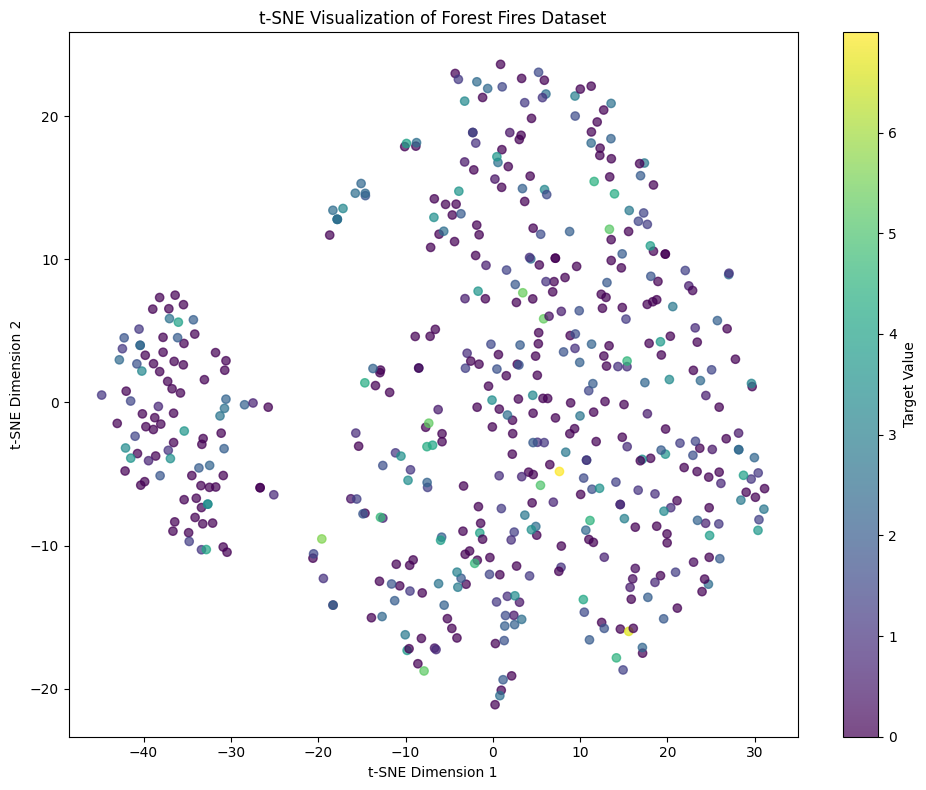


Applying PCA to Forest Fires dataset...


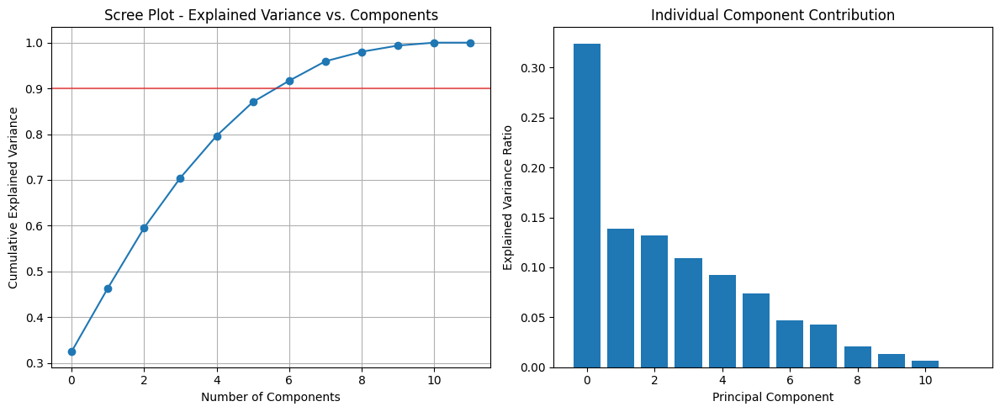

Number of components explaining 90% variance: 7


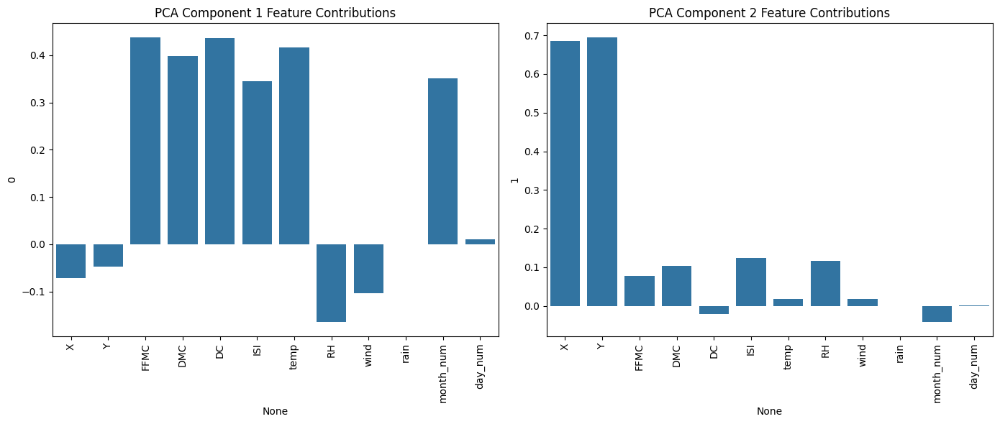

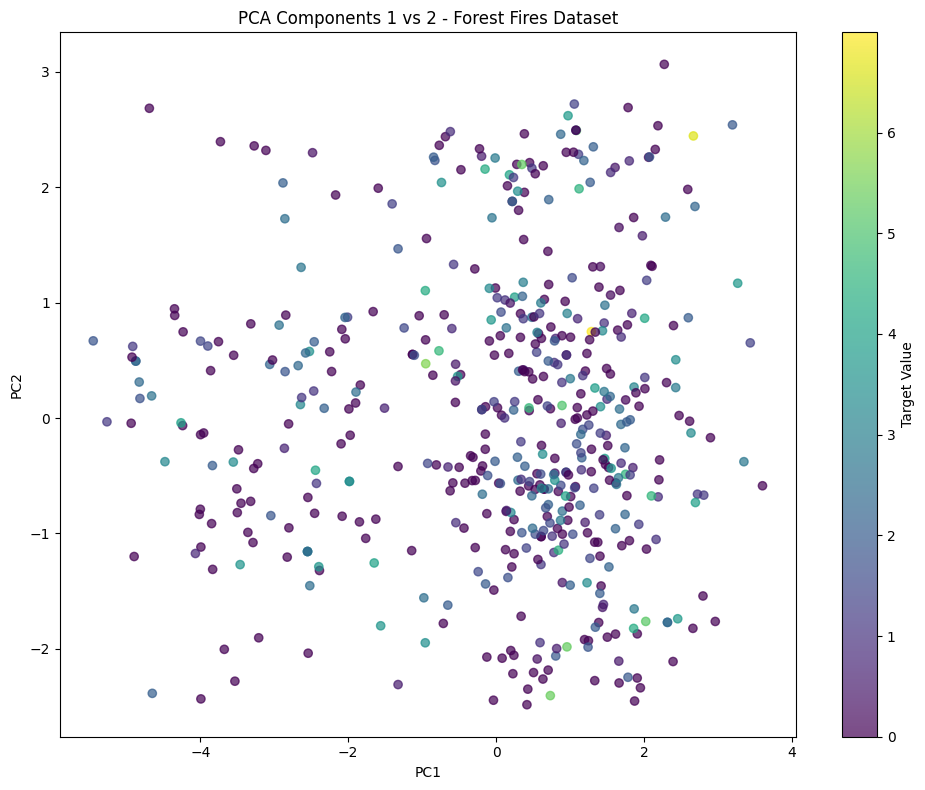


Applying LDA to Forest Fires dataset...


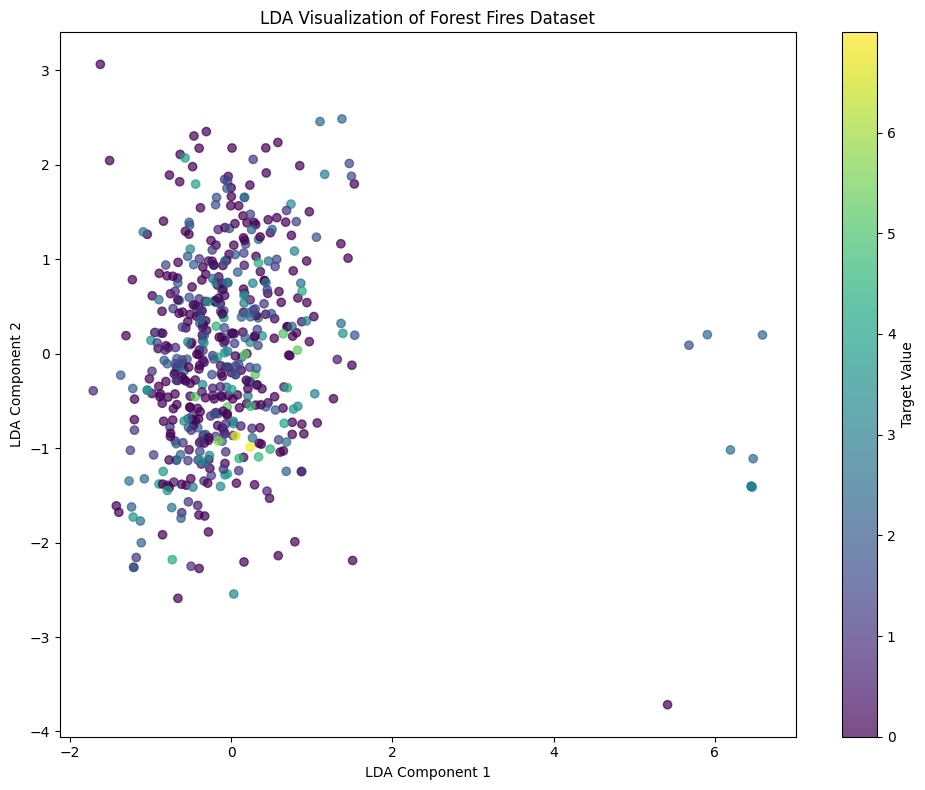

Best LDA n_components: 1


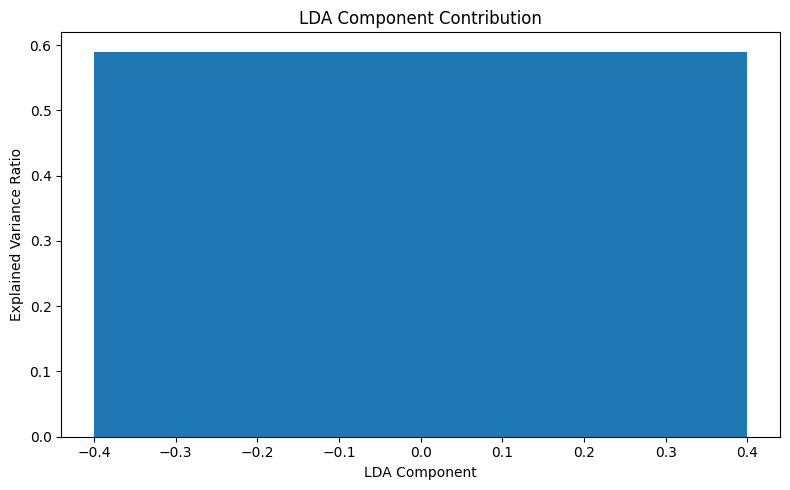

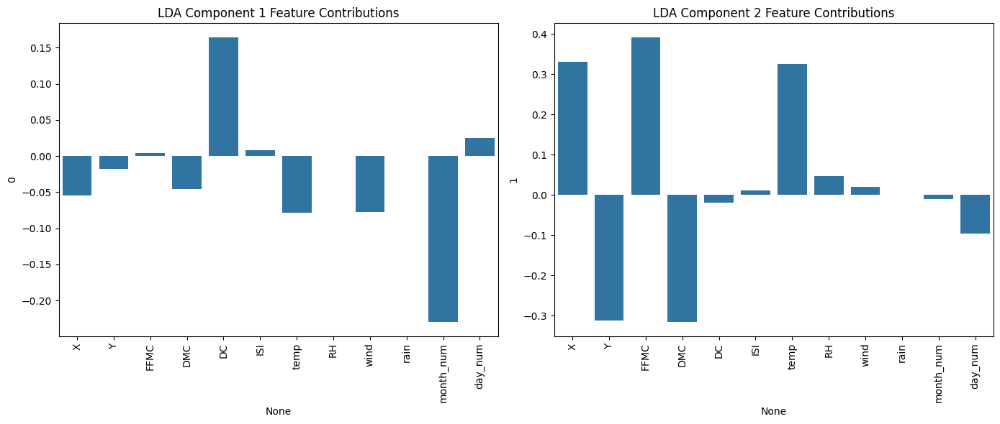


Running regression models on Wine Quality dataset

Evaluating k-NN on Wine Quality dataset...
  Fold 1 - RMSE: 0.6973, MAE: 0.5285, R²: 0.3416
  Fold 2 - RMSE: 0.7042, MAE: 0.5274, R²: 0.3494
  Fold 3 - RMSE: 0.7028, MAE: 0.5230, R²: 0.3580
  Fold 4 - RMSE: 0.7063, MAE: 0.5307, R²: 0.3613
  Fold 5 - RMSE: 0.6907, MAE: 0.5125, R²: 0.3721

k-NN on Wine Quality - Average Metrics:
  RMSE: 0.7003 ± 0.0056
  MAE: 0.5244 ± 0.0064
  R²: 0.3565 ± 0.0104
  Avg. Training Time: 0.0109 seconds
  Avg. Prediction Time: 0.0976 seconds

Evaluating Decision Tree on Wine Quality dataset...
  Fold 1 - RMSE: 0.7903, MAE: 0.5669, R²: 0.1543
  Fold 2 - RMSE: 0.7927, MAE: 0.5560, R²: 0.1757
  Fold 3 - RMSE: 0.7681, MAE: 0.5515, R²: 0.2330
  Fold 4 - RMSE: 0.7687, MAE: 0.5685, R²: 0.2433
  Fold 5 - RMSE: 0.7397, MAE: 0.5317, R²: 0.2799

Decision Tree on Wine Quality - Average Metrics:
  RMSE: 0.7719 ± 0.0191
  MAE: 0.5549 ± 0.0133
  R²: 0.2172 ± 0.0459
  Avg. Training Time: 0.0507 seconds
  Avg. Prediction Ti

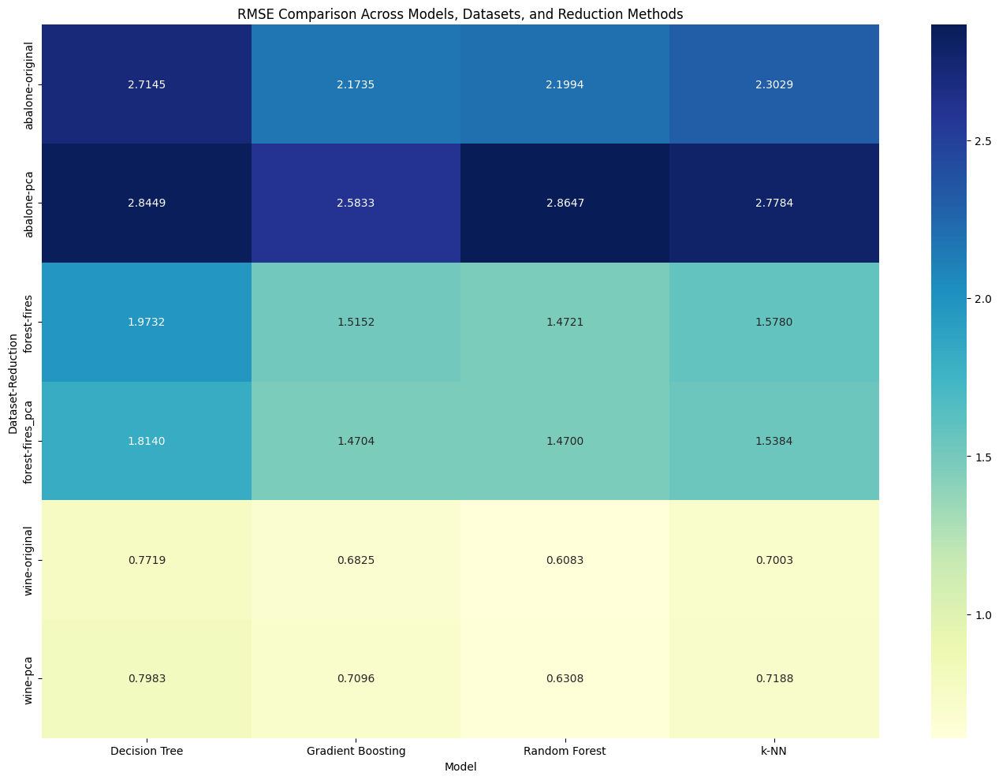

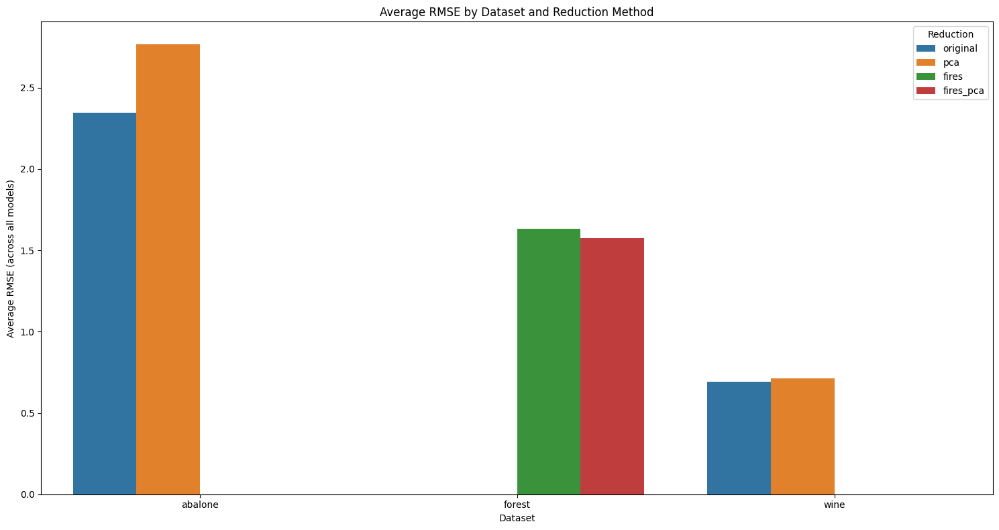


Dimensionality Reduction Summary:
     Dataset   Method  Dimensions  Reduction (%)
        wine Original          12       0.000000
        wine      PCA           7      41.666667
     abalone Original           9       0.000000
     abalone      PCA           2      77.777778
forest_fires Original          12       0.000000
forest_fires      PCA           7      41.666667

Performance Impact of Dimensionality Reduction:
     Dataset             Model Method Original RMSE Reduced RMSE Change (%)
        wine              k-NN    PCA        0.7003       0.7188       2.65
        wine     Decision Tree    PCA        0.7719       0.7983       3.42
        wine     Random Forest    PCA        0.6083       0.6308       3.69
        wine Gradient Boosting    PCA        0.6825       0.7096       3.96
     abalone              k-NN    PCA        2.3029       2.7784      20.65
     abalone     Decision Tree    PCA        2.7145       2.8449       4.81
     abalone     Random Forest    PCA    

In [18]:
# Main function to run the full analysis
def run_representation_learning_analysis(datasets):
    """
    Run full representation learning analysis

    Parameters:
    datasets (dict): Dictionary with preprocessed datasets

    Returns:
    tuple: (reduced_datasets, regression_results)
    """
    # Apply representation learning to create reduced datasets
    reduced_datasets = apply_representation_learning(datasets)

    # Run regression on original and reduced datasets
    results = compare_regression_on_reduced_datasets(datasets, reduced_datasets)

    return reduced_datasets, results

if __name__ == "__main__":
    # Assuming datasets is already loaded from previous steps
    # datasets = load_and_preprocess_all_datasets()

    # Run representation learning analysis
    reduced_datasets, results = run_representation_learning_analysis(datasets)